In [1]:
import sys
sys.path.append('/home/simone/Desktop/NLFF/Experiments/cumulativeReturnPeper')

import numpy as np
from sklearn.metrics import confusion_matrix
from sklearn.metrics import matthews_corrcoef, accuracy_score
from sklearn.metrics import mean_squared_error as MSE
import time
from datetime import datetime, timedelta
from sklearn import svm
import pandas as pd
import matplotlib.pyplot as plt
import math
from sklearn import preprocessing
from math import sqrt
import seaborn as sns; sns.set()
import pickle

from technicalSignals import Indicators


In [2]:
tickers=['AAPL','AMZN','GOOGL','MSFT','FB','INTC','CSCO','CMCSA','NVDA','NFLX']
TREND_WINDOWs = [(-48,0),(-35,0),(-28,0),(-7,0),(-1,0),(1,2),(1,8),(1,29),(1,36),(1,50)]
kind_of_dataset = 'Summary'


In [3]:
class DatasetManager:
    def __init__(self):
        X_raw = None
        Y_raw = None
        Y = None
        X = None
        cum_ret = None
    
    def load_dataset(self, ticker, kind, technicalFeatures=False):
        types = {'Summary': '/home/simone/Desktop/NLFF/intrinioDatasetUpdated/SentimentFullAggregatedHourly/',
            'AffectiveSpace': '/home/simone/Desktop/NLFF/AffectiveSpace/Aggregated_AffectSummary_dataset/',
            'Title': '/home/simone/Desktop/NLFF/intrinioDatasetUpdated/SentimentTitleAggregatedHourly/',
            'Senticnet':''}
        news =  pd.read_csv(types[kind]+ticker+'.csv')
        price = pd.read_csv('/home/simone/Desktop/NLFF/indexes/indexes'+ticker+'.csv')
        price = price.rename(index=str, columns={"date": "DATE"})
        news = news.rename(index=str, columns={"initTime": "DATE"})
        news = news.drop(['Unnamed: 0'], axis=1)
        news['DATE'] = [datetime.strptime(row, '%Y-%m-%d %H:%M:%S') for row in news['DATE']]
        # This datased is already GMT+0
        price['DATE'] = [datetime.strptime(row, '%Y-%m-%d %H:%M:%S') for row in price['DATE']]
        if(technicalFeatures):
            price['mom_30'] = Indicators.momentum(price, 30)
            price['mom_50'] = Indicators.momentum(price, 50)
            price['mom_100'] = Indicators.momentum(price, 100)
            price['mom_150'] = Indicators.momentum(price, 150)
            price['SMA_30'] = Indicators.SMA(price, 30)
            price['SMA_50'] = Indicators.SMA(price, 50)
            price['SMA_100'] = Indicators.SMA(price, 100)
            price['SMA_150'] = Indicators.SMA(price, 150)
            price['in_BBands'] = Indicators.inBBands(price)
            price['eccessVolumes'] = Indicators.eccessOfVolumes(price)
#             price['AARON_30'] = Indicators.aaron(price,30)
#             price['AARON_50'] = Indicators.aaron(price, 50)
#             price['AARON_100'] = Indicators.aaron(price, 100)
#             price['AARON_150'] = Indicators.aaron(price, 150)
#             price['MACD_30_10'] = Indicators.MACD(price, 30,10)
#             price['MACD_50_30'] = Indicators.MACD(price, 50,30)
#             price['MACD_100_50'] = Indicators.MACD(price, 100,50)
#             price['MACD_150_75'] = Indicators.MACD(price, 150,75)
            

        #ALLIGNMENT
        initDate = max(news['DATE'][0], datetime(2017, 5, 22, 0, 0, 0))
        finalDate = min(news['DATE'][len(news)-1],datetime(2018, 6, 21, 0, 0, 0))
        news.drop(news[news.DATE > finalDate].index, inplace=True)
        news.drop(news[news.DATE < initDate].index, inplace=True)
        news = news.reset_index(drop=True)
        price.drop(price[price.DATE > finalDate].index, inplace=True)
        price.drop(price[price.DATE < initDate].index, inplace=True)
        price = price.reset_index(drop=True)
        assert len(price) == len(news)
        # FEATURES
        sentiment = news.drop(['DATE'], axis=1)
        X = sentiment
        for window in [5,10,15,20,30,50]:
            temp = sentiment.rolling(window).mean()
            temp.columns = temp.columns +'_'+str(window)
            X = pd.concat([X, temp],axis=1)
        if(technicalFeatures):   
            technical_features = ['mom_30','mom_50','mom_100','mom_150',
                                  'SMA_30','SMA_50','SMA_100','SMA_150',
                                  'in_BBands', 'eccessVolumes']
            #'AARON_30', 'AARON_50', 'AARON_100', 'AARON_150','MACD_30_10', 'MACD_50_30', 'MACD_100_50','MACD_150_75'] 
            X = pd.concat([X, price[technical_features]],axis=1)

        #NORMALIZATION:
        min_max_scaler = preprocessing.MinMaxScaler()
        X = np.nan_to_num(np.asarray(X, dtype=float))
        X = np.asarray(min_max_scaler.fit_transform(X))
        self.X_raw = X
        self.Y_raw = price

    def get_dataset_for_trend(self, init, finish, perc_train = 0.7):
        y = list()
        x = list()
        dates = list()
        price = self.Y_raw
        for i in range(abs(init),len(price)-finish):
            cumulative_return =  (price.iloc[i+finish]['open']-price.iloc[i+init]['open'])/price.iloc[i+init]['open']
            y.append(cumulative_return)
            dates.append(price.iloc[i]['DATE'])
            x.append(self.X_raw[i])
        
       #y = self.normalize(np.array(y))
        y = np.array(y)
        x = np.array(x)
        self.X = x
        self.Y = y
        nt=math.ceil(len(x)*perc_train)
        x_tv = x[:nt]
        y_tv = y[:nt]
        x_test = x[nt:]
        y_test = y[nt:]
        dates_test = dates[nt:]
        return (x_tv,y_tv),(x_test,y_test),dates_test
    
    def normalize(self, values):
        m = min(values)
        M = max(values)
        values = 2*(values-m)/(M-m)-1
        return values


In [4]:
def cv(x_tv,y_tv):
    best_mse = float(np.inf)
    best_c = 0
    best_g = 0
    for c in np.logspace(-4,4,15):
        for g in np.logspace(-4,4,15):
            print('.', end='')
            trainpoint=math.floor(len(x_tv)*0.50)
            dimval=math.floor(trainpoint*0.25)
            endval=trainpoint+dimval
            #Cross validation
            cvMSE = 0
            for i in range(0,4):
                x_train=x_tv[0:trainpoint]
                y_train=y_tv[0:trainpoint]
                x_val=x_tv[trainpoint:endval]
                y_val=y_tv[trainpoint:endval]  
                trainpoint=trainpoint+dimval
                endval=endval+dimval
                svm_model = svm.SVR(kernel='rbf', C=c, gamma=g, tol=1e-5, epsilon=1e-3)
                weights = np.power(y_train,2)
                m = min(weights)
                M = max(weights)
                weights = (weights-m)/(M-m)
                svm_model.fit(x_train,y_train, sample_weight = weights)
                y_pred = svm_model.predict(x_val)
                weights = np.power(y_val,2)
                m = min(weights)
                M = max(weights)
                weights = (weights-m)/(M-m)
                mse = MSE(y_val,y_pred, sample_weight = weights)
                cvMSE += mse/4
            if(cvMSE < best_mse):
                best_mse = cvMSE
                best_c = c
                best_g = g
    return (best_c,best_g)

def sign(vec):
    return [1 if v>0 else 0 for v in vec]




==================== AAPL ==================== 



trend:  -48   0
Best C:  10000.0  best gamma:  0.0003727593720314938


/home/simone/anaconda3/lib/python3.6/site-packages/sklearn/metrics/classification.py:538: RuntimeWarning: invalid value encountered in double_scalars
  mcc = cov_ytyp / np.sqrt(cov_ytyt * cov_ypyp)


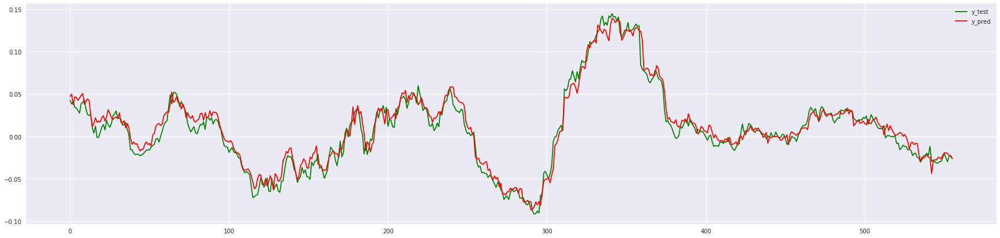

trend:  -35   0
Best C:  10000.0  best gamma:  0.0003727593720314938


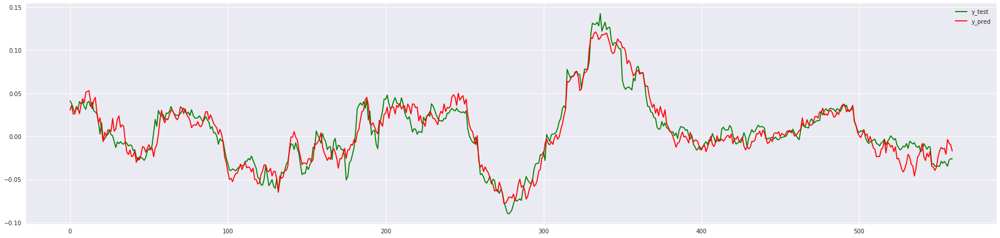

trend:  -28   0
Best C:  2682.695795279722  best gamma:  0.0003727593720314938


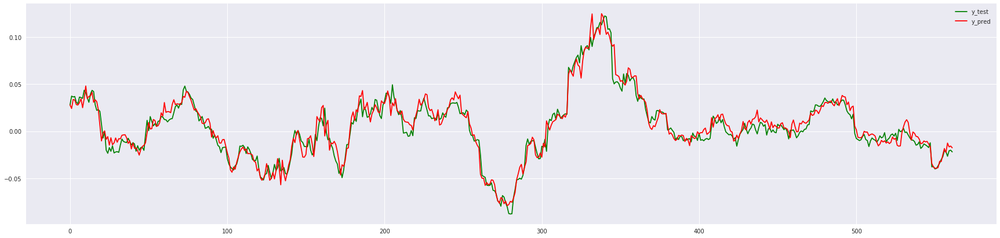

trend:  -7   0
Best C:  719.6856730011514  best gamma:  0.019306977288832496


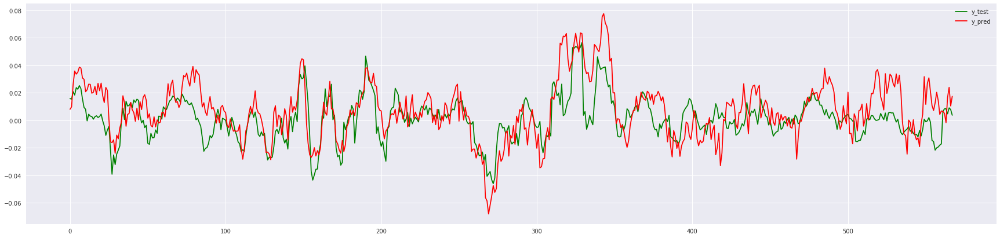

trend:  -1   0
Best C:  3.727593720314938  best gamma:  0.2682695795279725


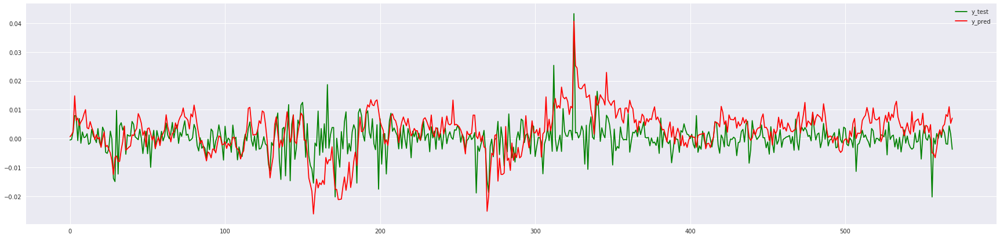

trend:  1   2
Best C:  51.79474679231202  best gamma:  13.89495494373136


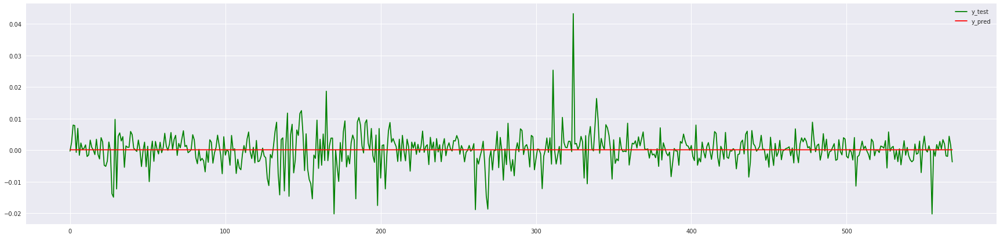

trend:  1   8
Best C:  10000.0  best gamma:  0.2682695795279725


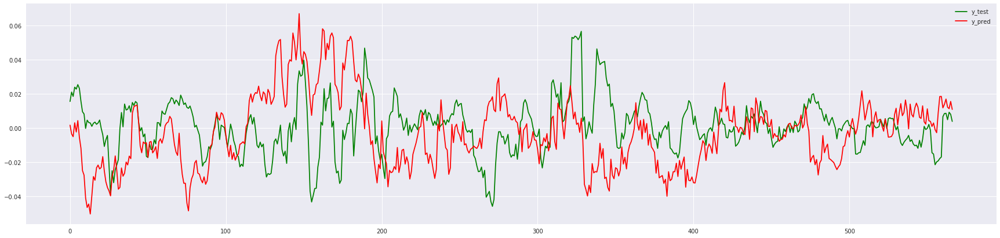

trend:  1   29
Best C:  1.0  best gamma:  0.2682695795279725


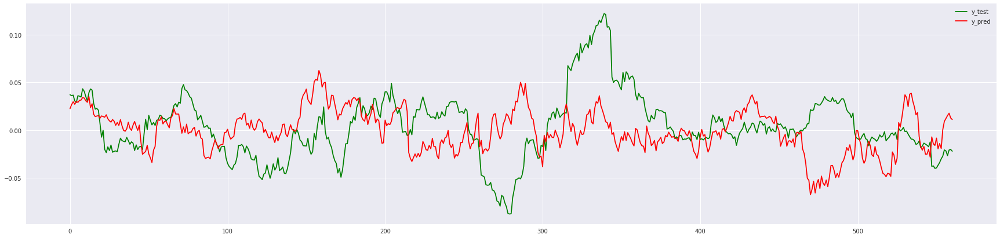

trend:  1   36
Best C:  1.0  best gamma:  0.2682695795279725


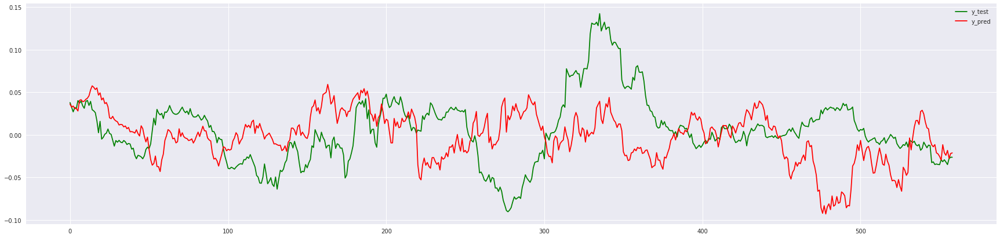

trend:  1   50
Best C:  0.2682695795279725  best gamma:  0.2682695795279725


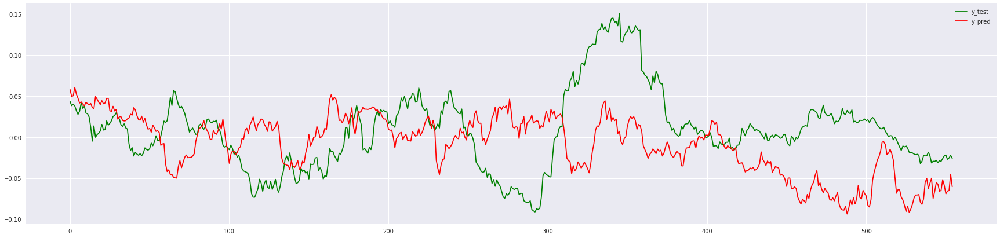

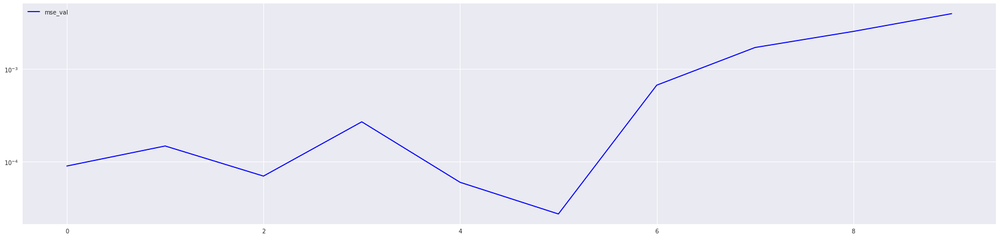

[8.961823897202412e-05, 0.00014727238158844584, 6.983260013753356e-05, 0.0002682005268816074, 5.984741265034811e-05, 2.729804873173114e-05, 0.0006649747380978729, 0.0016920769098869924, 0.002522024714271376, 0.003917695807523626]



==================== AMZN ==================== 



trend:  -48   0
Best C:  2682.695795279722  best gamma:  0.0003727593720314938


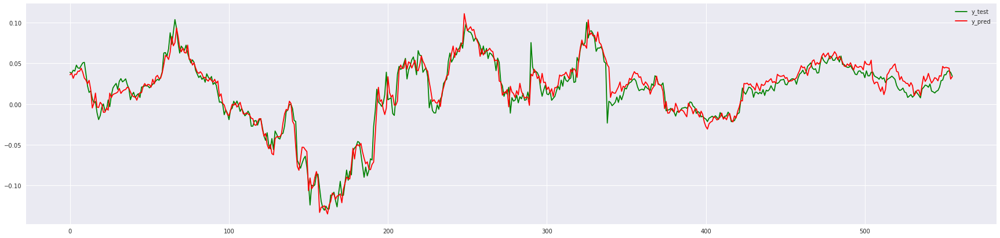

trend:  -35   0
Best C:  10000.0  best gamma:  0.0013894954943731374


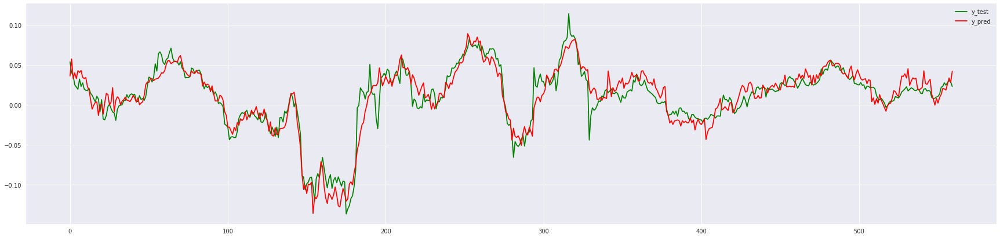

trend:  -28   0
Best C:  2682.695795279722  best gamma:  0.0013894954943731374


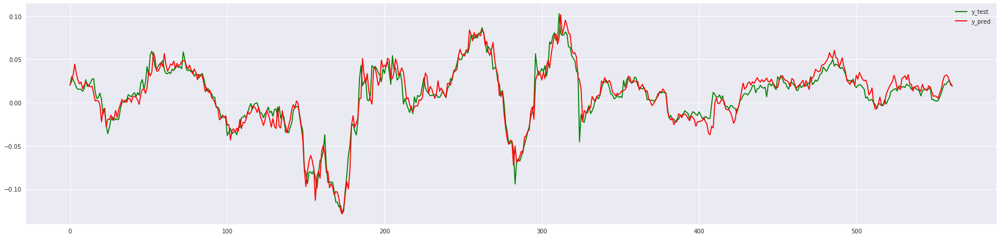

trend:  -7   0
Best C:  10000.0  best gamma:  0.005179474679231213


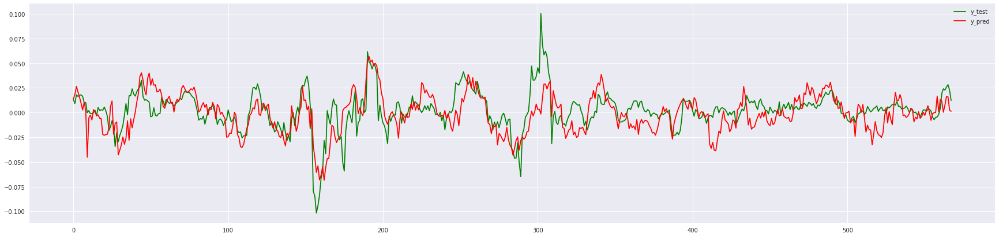

trend:  -1   0
Best C:  10000.0  best gamma:  0.0003727593720314938


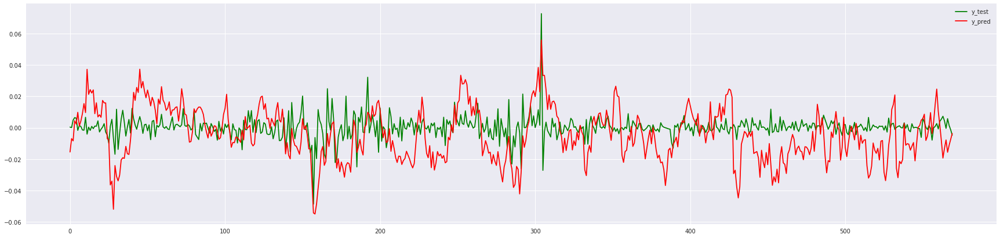

trend:  1   2
Best C:  1.0  best gamma:  1.0


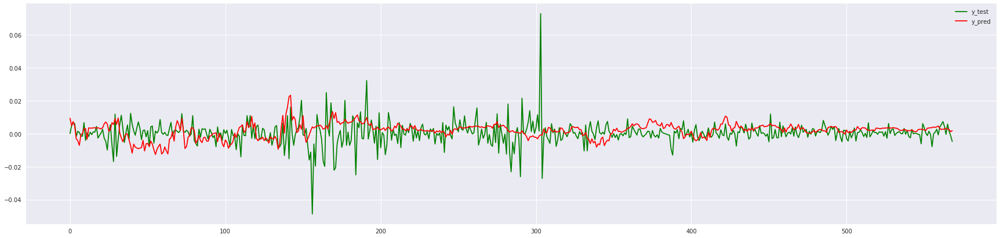

trend:  1   8
Best C:  10000.0  best gamma:  0.2682695795279725


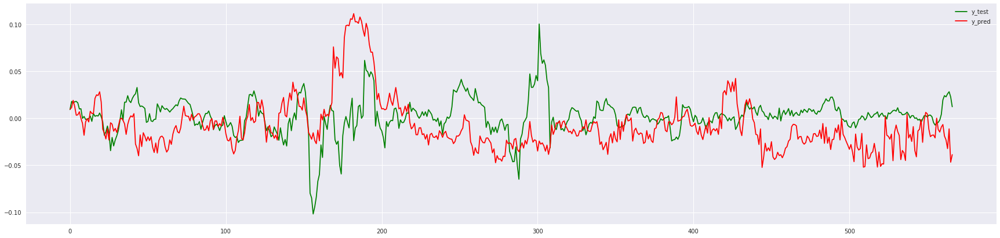

trend:  1   29
Best C:  0.019306977288832496  best gamma:  1.0


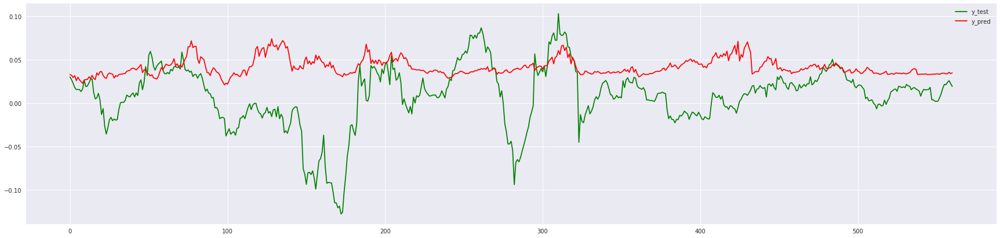

trend:  1   36
Best C:  0.019306977288832496  best gamma:  1.0


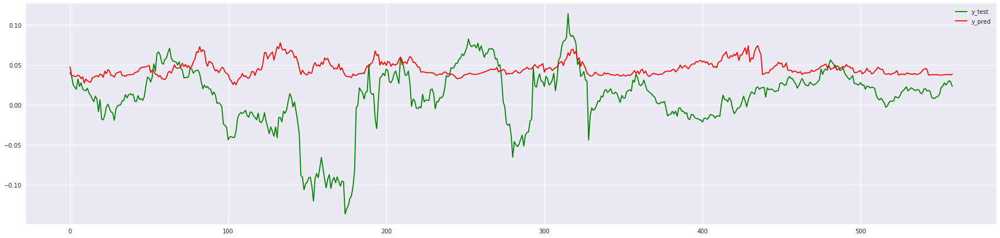

trend:  1   50
Best C:  0.019306977288832496  best gamma:  1.0


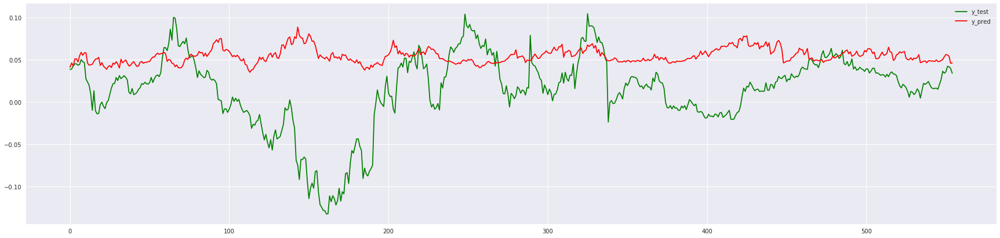

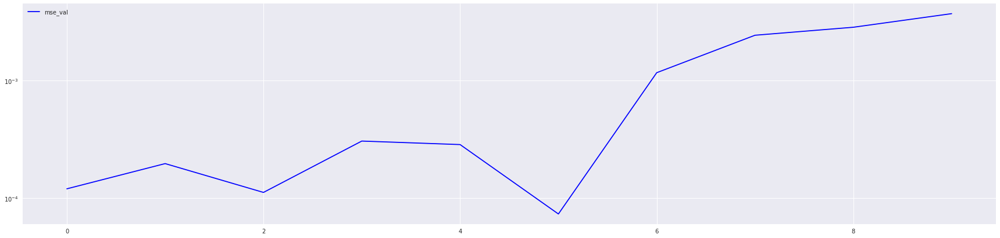

[0.00011950589721355522, 0.00019592125007844474, 0.00011135454415833824, 0.0003047614789775779, 0.00028452602043035983, 7.297612550032853e-05, 0.00116452149897412, 0.0024269622674776, 0.002838787759528671, 0.003705847749278084]



==================== GOOGL ==================== 



trend:  -48   0
Best C:  2682.695795279722  best gamma:  0.0003727593720314938


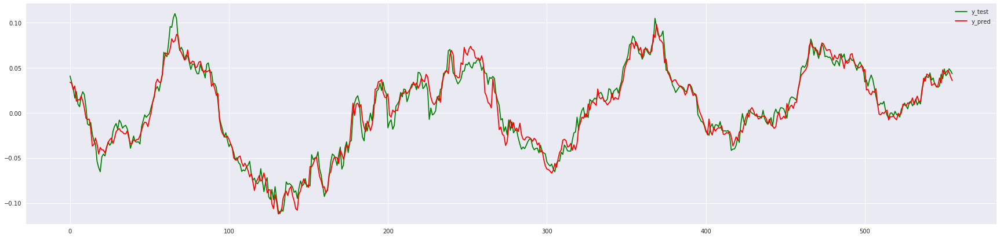

trend:  -35   0
Best C:  10000.0  best gamma:  0.0001


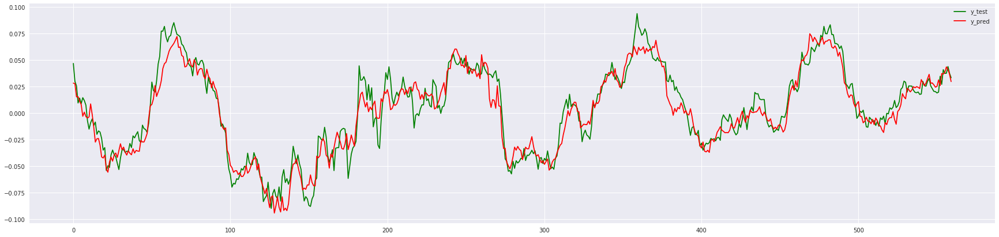

trend:  -28   0
Best C:  51.79474679231202  best gamma:  0.005179474679231213


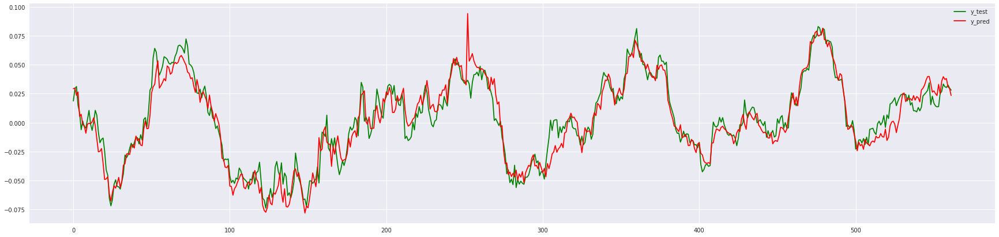

trend:  -7   0
Best C:  719.6856730011514  best gamma:  0.0013894954943731374


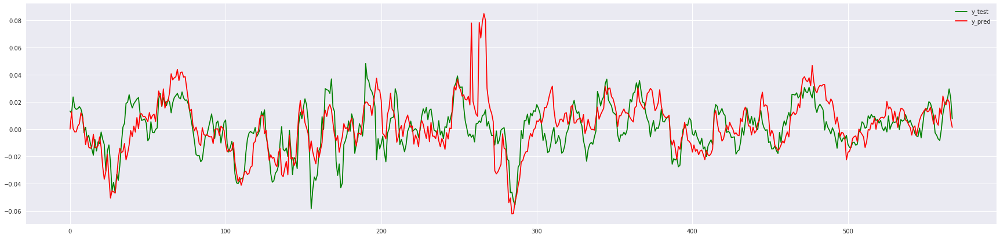

trend:  -1   0
Best C:  193.06977288832496  best gamma:  0.005179474679231213


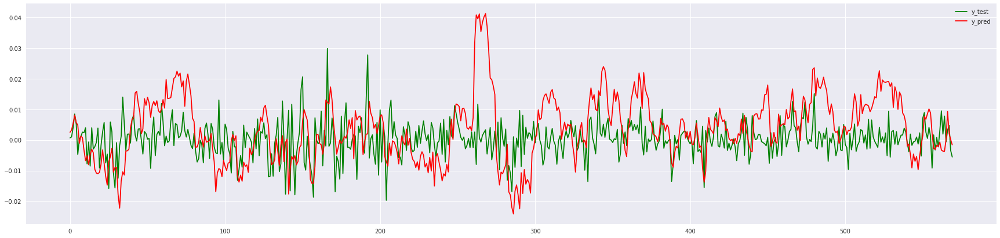

trend:  1   2
Best C:  719.6856730011514  best gamma:  13.89495494373136


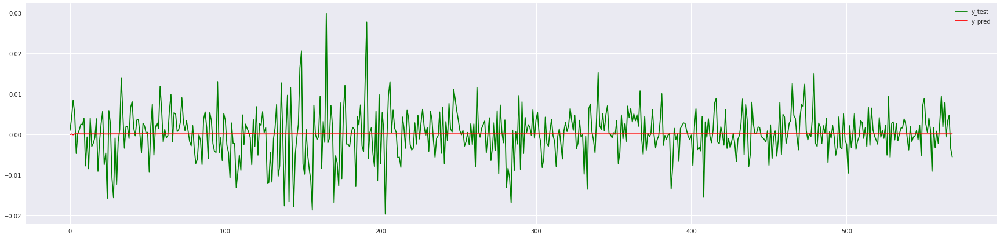

trend:  1   8
Best C:  10000.0  best gamma:  3.727593720314938


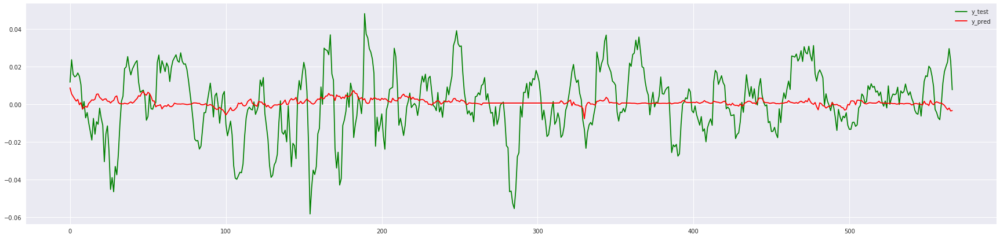

trend:  1   29
Best C:  0.019306977288832496  best gamma:  0.2682695795279725


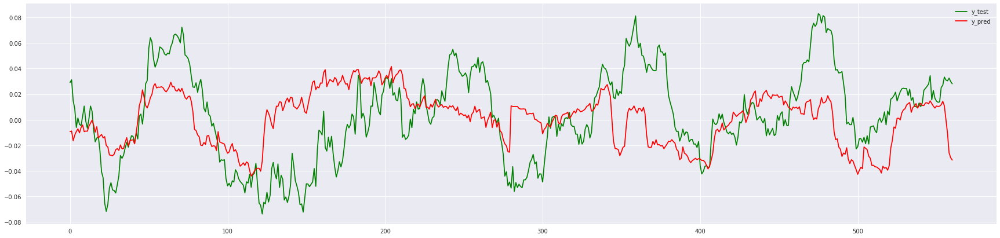

trend:  1   36
Best C:  0.019306977288832496  best gamma:  0.2682695795279725


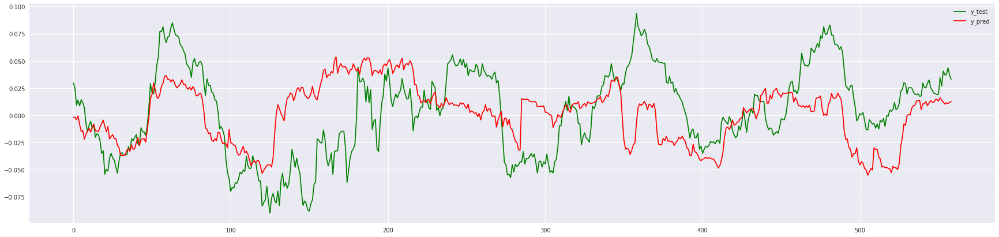

trend:  1   50
Best C:  13.89495494373136  best gamma:  1.0


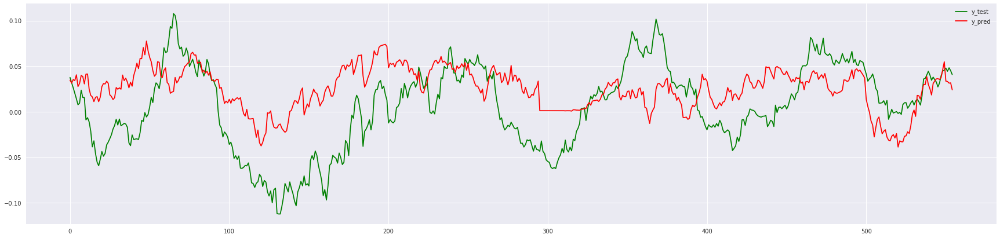

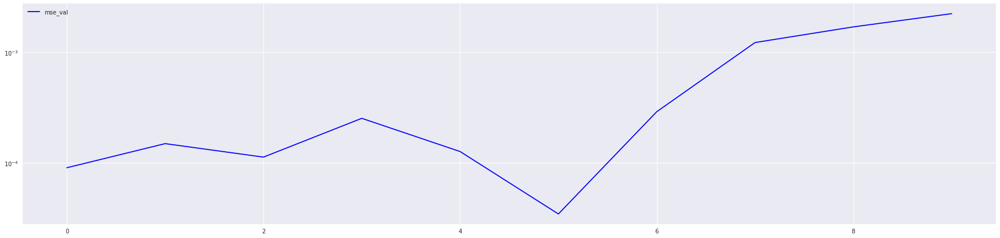

[9.05633550644684e-05, 0.00014941860353077306, 0.00011293219830368286, 0.00025272220578421815, 0.00012681548160435938, 3.467514682053793e-05, 0.0002898023202426948, 0.0012190635690249357, 0.001687340476157705, 0.0022213414323644476]



==================== MSFT ==================== 



trend:  -48   0
Best C:  10000.0  best gamma:  0.0001


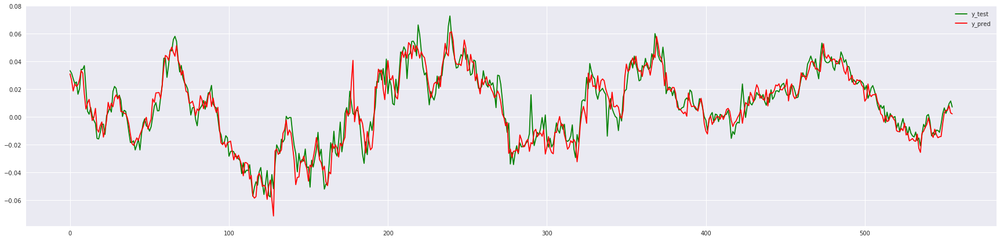

trend:  -35   0
Best C:  10000.0  best gamma:  0.0003727593720314938


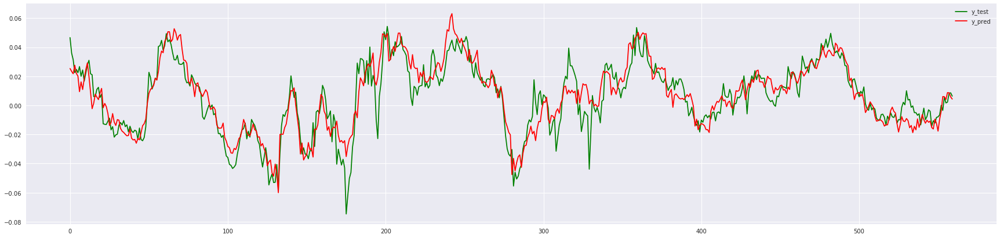

trend:  -28   0
Best C:  10000.0  best gamma:  0.0001


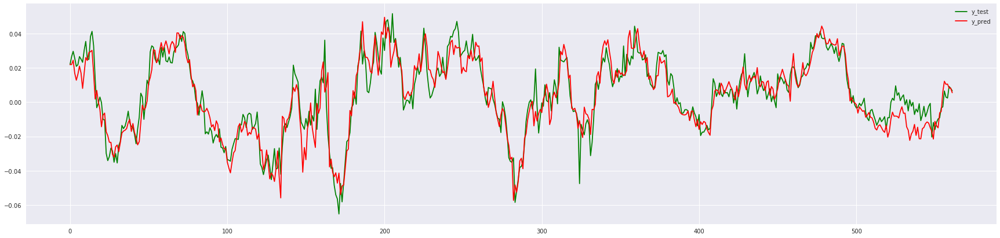

trend:  -7   0
Best C:  10000.0  best gamma:  0.0001


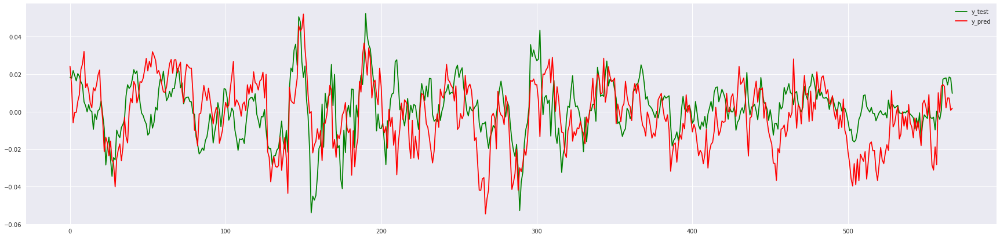

trend:  -1   0
Best C:  10000.0  best gamma:  0.0001


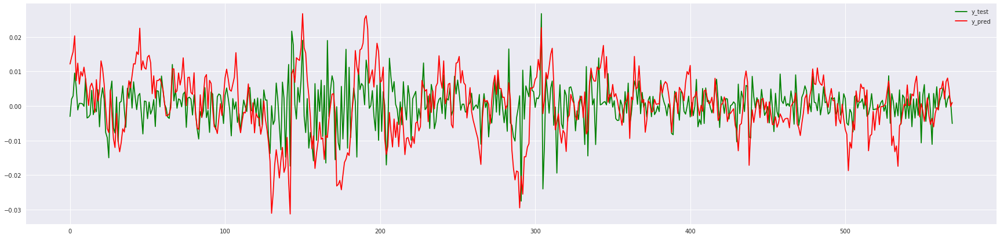

trend:  1   2
Best C:  13.89495494373136  best gamma:  13.89495494373136


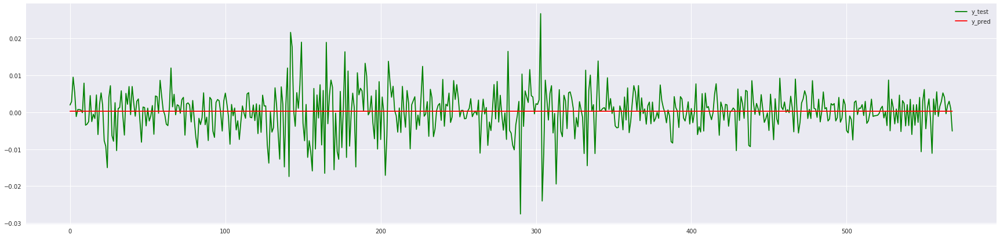

trend:  1   8
Best C:  0.005179474679231213  best gamma:  0.2682695795279725


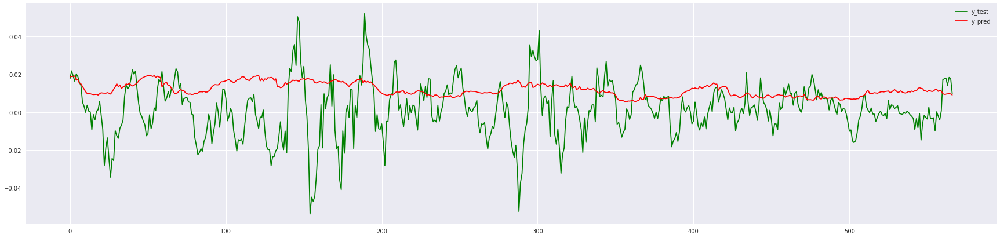

trend:  1   29
Best C:  0.0013894954943731374  best gamma:  3.727593720314938


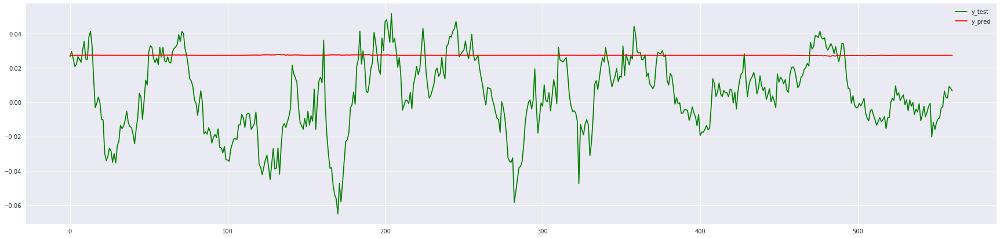

trend:  1   36
Best C:  0.0003727593720314938  best gamma:  0.0001


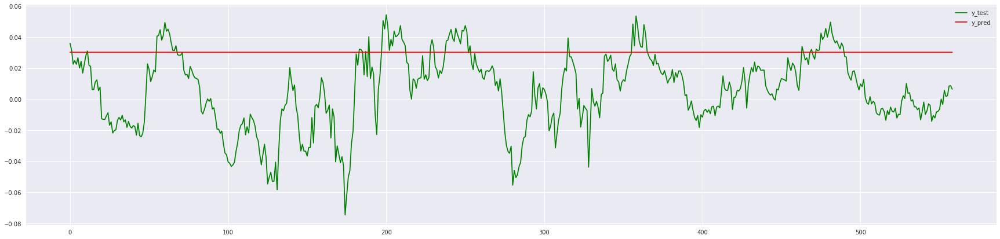

trend:  1   50
Best C:  3.727593720314938  best gamma:  0.2682695795279725


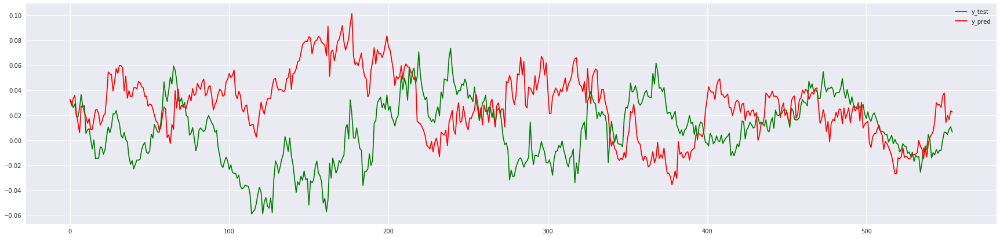

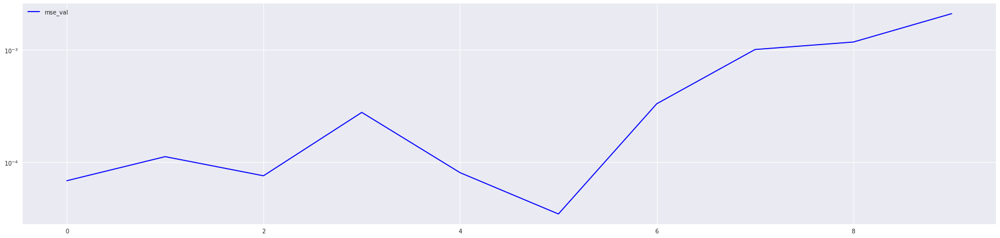

[6.842660745056008e-05, 0.0001119804551036434, 7.568750407103275e-05, 0.00027706812544283754, 8.064079244025381e-05, 3.4624664730871014e-05, 0.00033047312661609274, 0.0010038871909182586, 0.0011702446827628484, 0.0020918284621437785]



==================== FB ==================== 



trend:  -48   0
Best C:  719.6856730011514  best gamma:  0.0003727593720314938


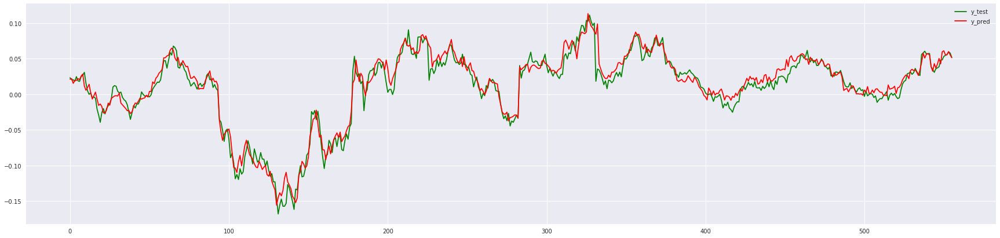

trend:  -35   0
Best C:  10000.0  best gamma:  0.0003727593720314938


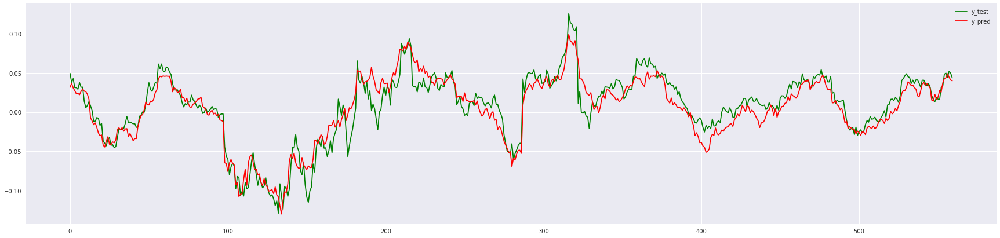

trend:  -28   0
Best C:  2682.695795279722  best gamma:  0.0003727593720314938


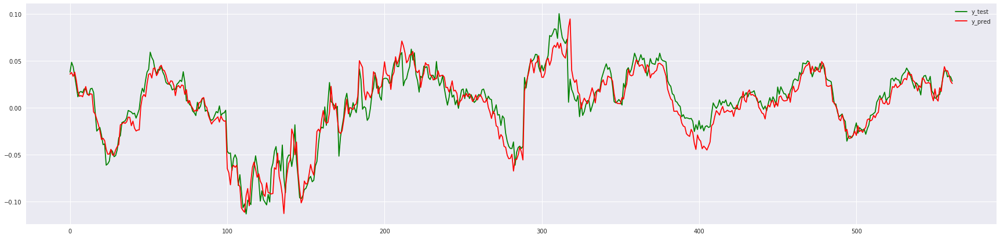

trend:  -7   0
Best C:  2682.695795279722  best gamma:  0.0001


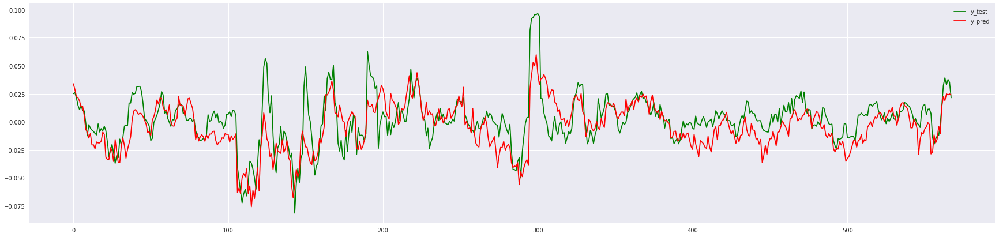

trend:  -1   0
Best C:  193.06977288832496  best gamma:  0.07196856730011514


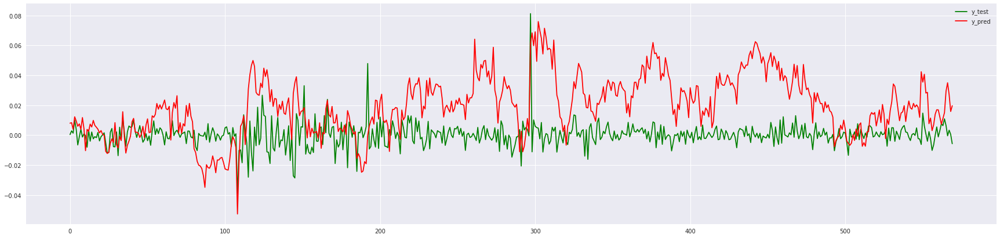

trend:  1   2
Best C:  2682.695795279722  best gamma:  13.89495494373136


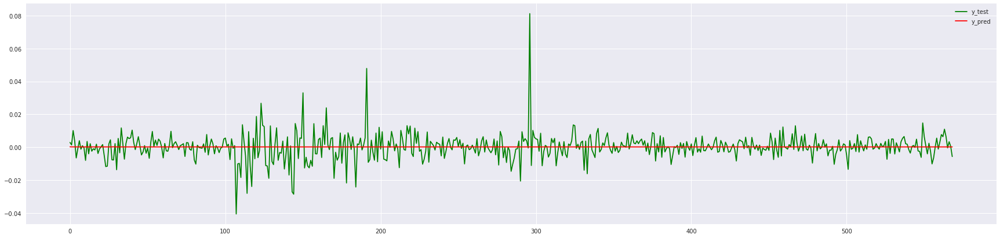

trend:  1   8
Best C:  0.07196856730011514  best gamma:  0.2682695795279725


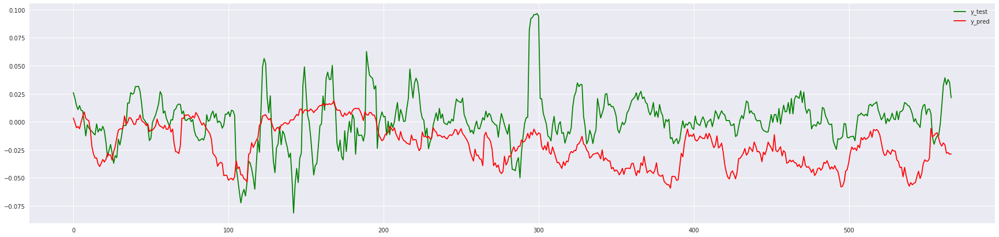

trend:  1   29
Best C:  13.89495494373136  best gamma:  3.727593720314938


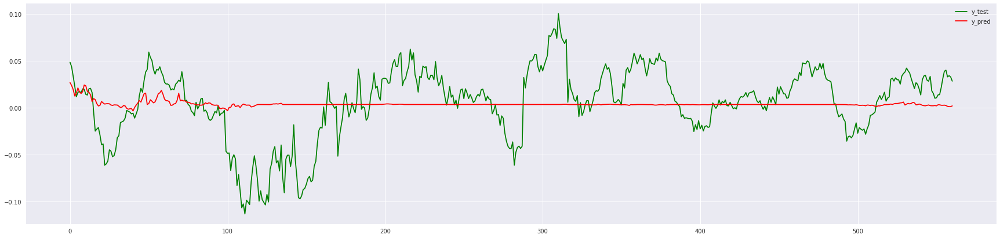

trend:  1   36
Best C:  51.79474679231202  best gamma:  3.727593720314938


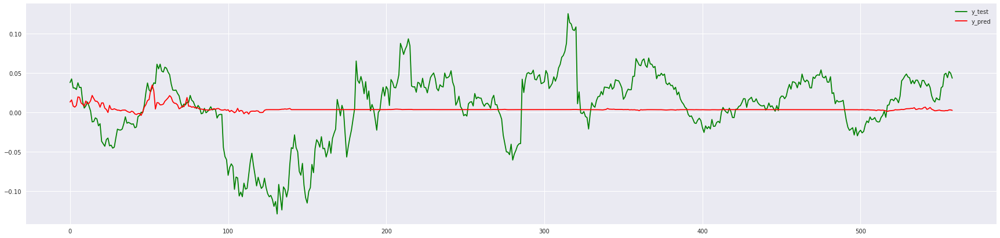

trend:  1   50
Best C:  193.06977288832496  best gamma:  3.727593720314938


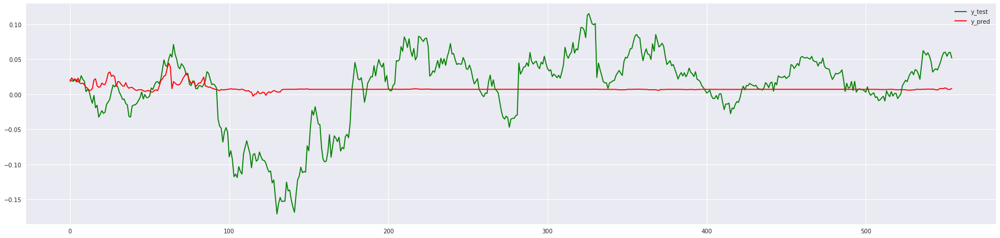

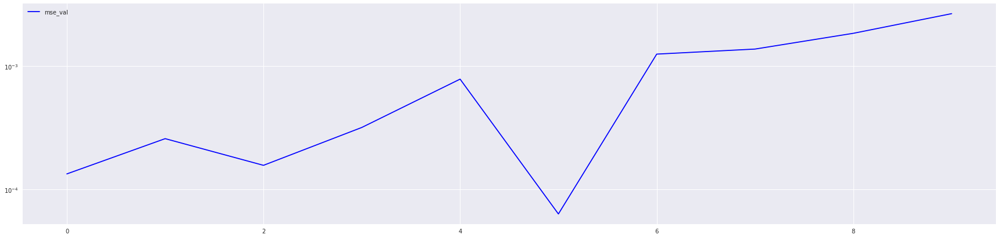

[0.00013386440599119453, 0.0002580199461308739, 0.0001570475788172296, 0.00031770923213333675, 0.0007810453530768173, 6.3512100169281e-05, 0.0012442184130840462, 0.0013667787944008768, 0.0018326770542631296, 0.002641842924568262]



==================== INTC ==================== 



trend:  -48   0
Best C:  10000.0  best gamma:  0.0001


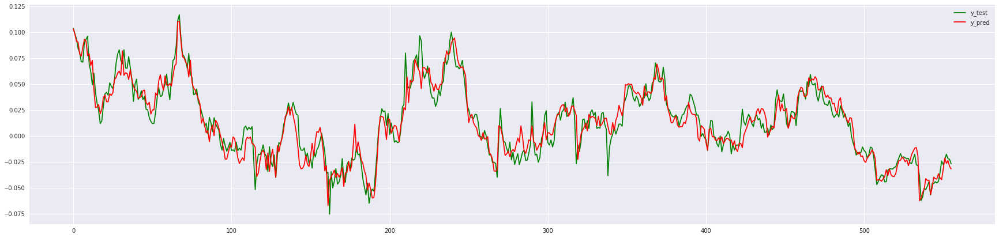

trend:  -35   0
Best C:  10000.0  best gamma:  0.0003727593720314938


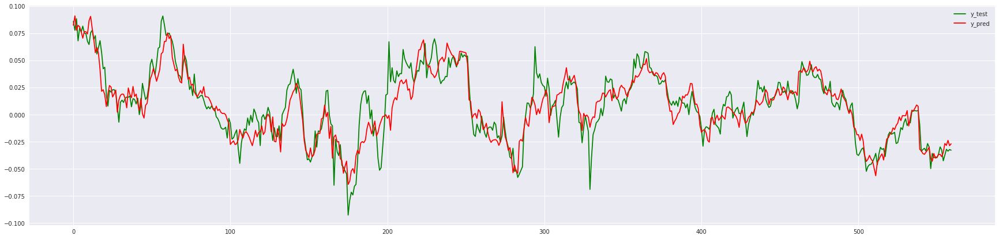

trend:  -28   0
Best C:  10000.0  best gamma:  0.0003727593720314938


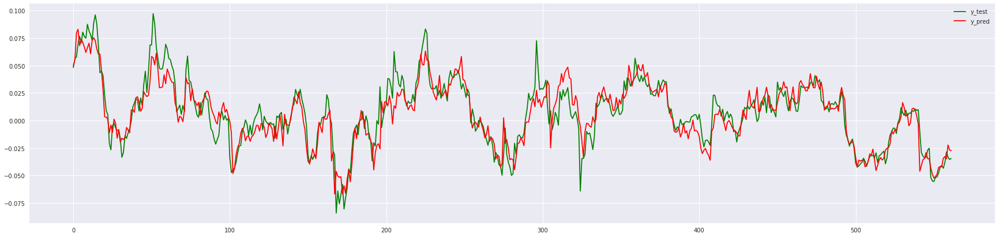

trend:  -7   0
Best C:  10000.0  best gamma:  0.0001


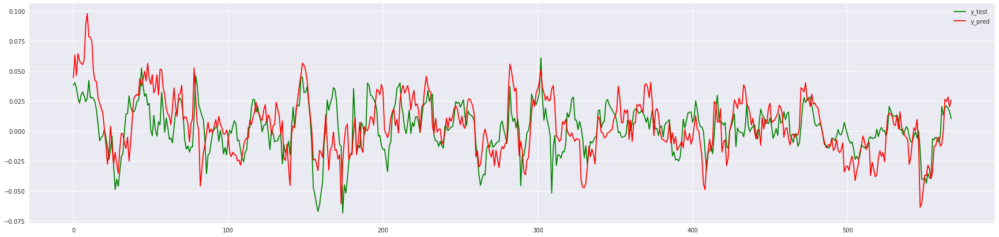

trend:  -1   0
Best C:  51.79474679231202  best gamma:  0.07196856730011514


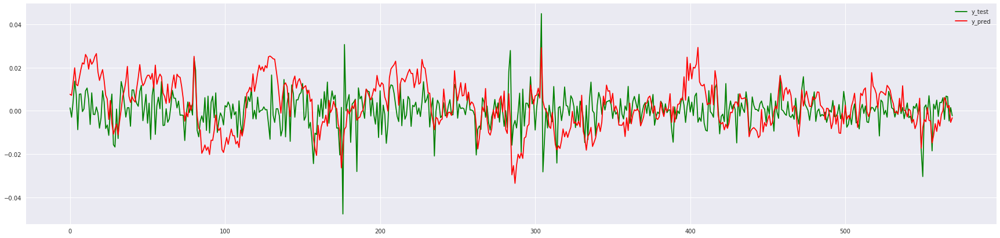

trend:  1   2
Best C:  719.6856730011514  best gamma:  0.2682695795279725


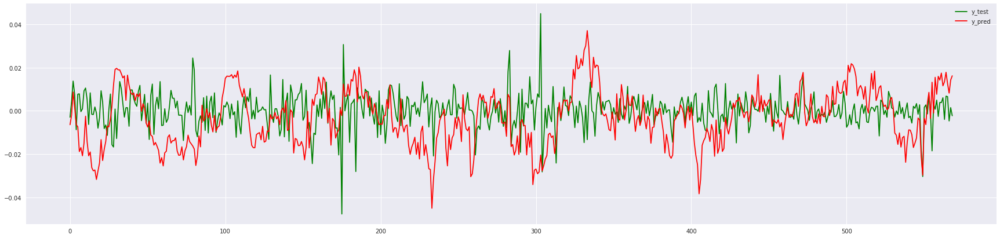

trend:  1   8
Best C:  0.2682695795279725  best gamma:  1.0


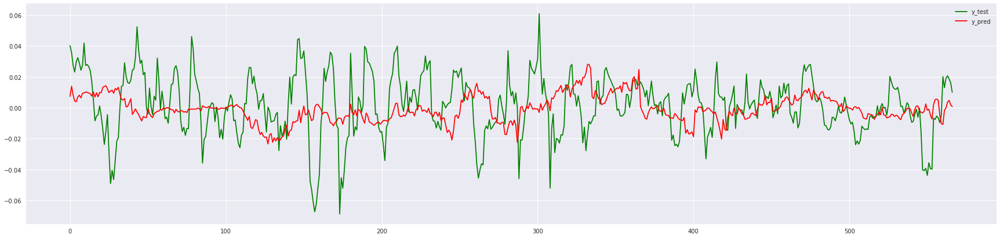

trend:  1   29
Best C:  10000.0  best gamma:  0.2682695795279725


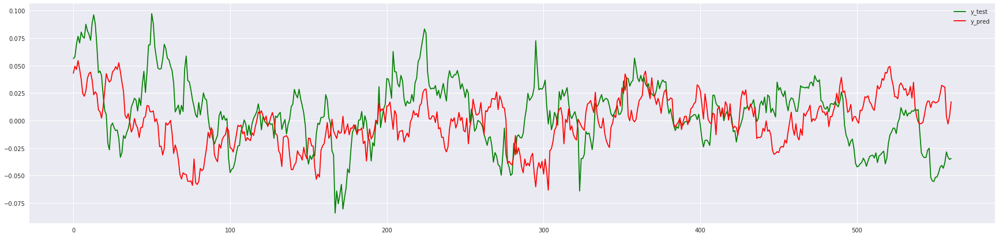

trend:  1   36
Best C:  10000.0  best gamma:  0.2682695795279725


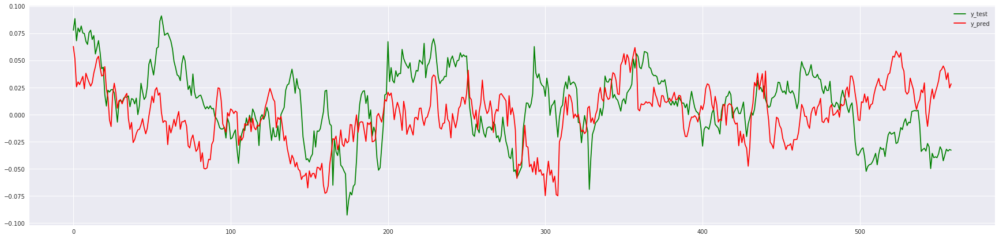

trend:  1   50
Best C:  10000.0  best gamma:  0.2682695795279725


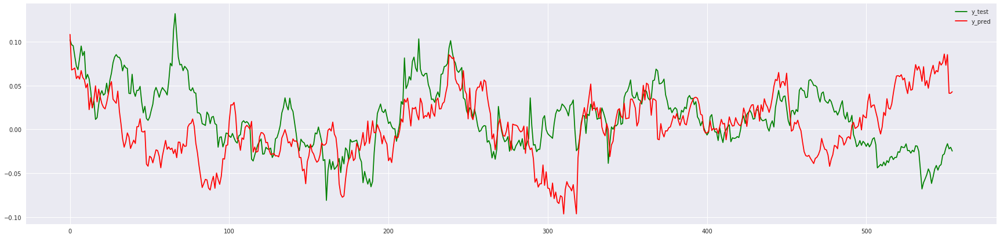

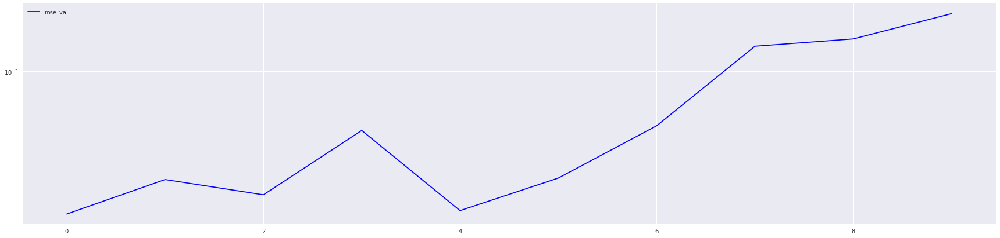

[0.00012698489177383687, 0.00020884499723949212, 0.0001675593719097548, 0.00042435248474293445, 0.00013333845984327578, 0.00021340796741342252, 0.0004539660516668936, 0.001432176018900339, 0.0015913862394178703, 0.0022928478354451386]



==================== CSCO ==================== 



trend:  -48   0
Best C:  10000.0  best gamma:  0.0001


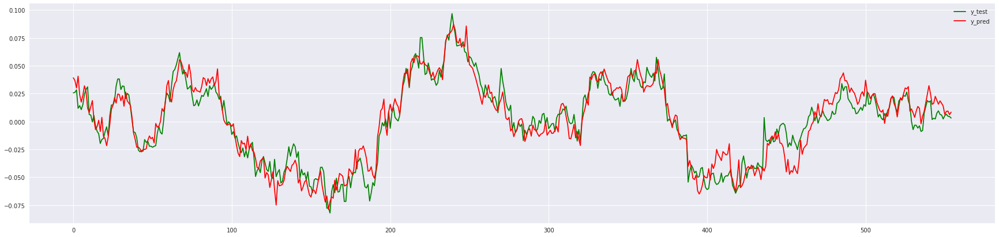

trend:  -35   0
Best C:  10000.0  best gamma:  0.0003727593720314938


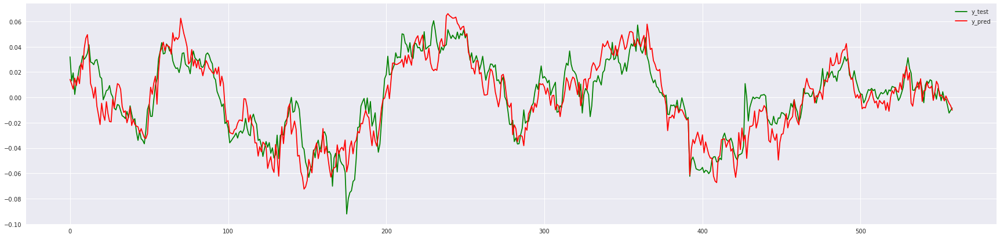

trend:  -28   0
Best C:  10000.0  best gamma:  0.0003727593720314938


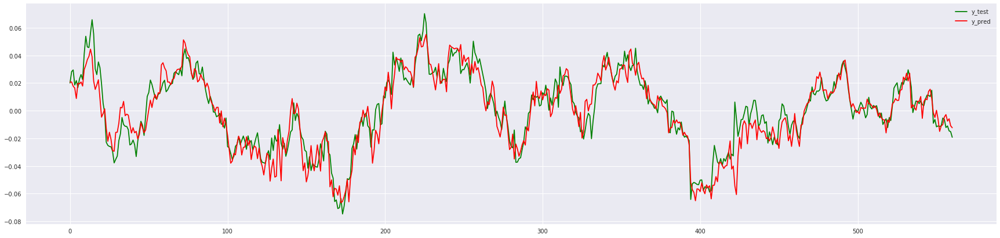

trend:  -7   0
Best C:  10000.0  best gamma:  0.0003727593720314938


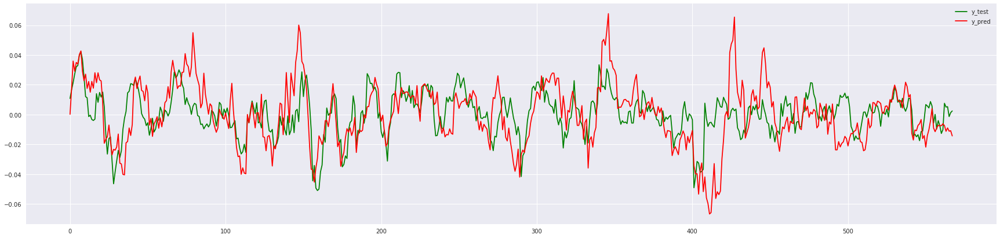

trend:  -1   0
Best C:  10000.0  best gamma:  0.0013894954943731374


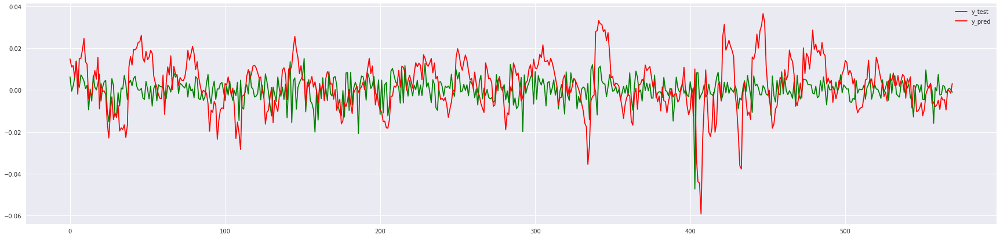

trend:  1   2
Best C:  0.07196856730011514  best gamma:  3.727593720314938


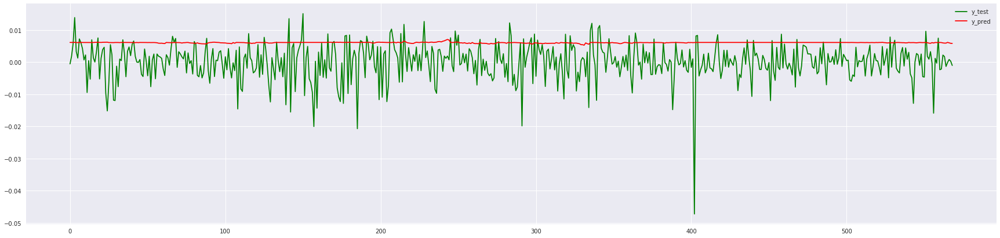

trend:  1   8
Best C:  0.07196856730011514  best gamma:  2682.695795279722


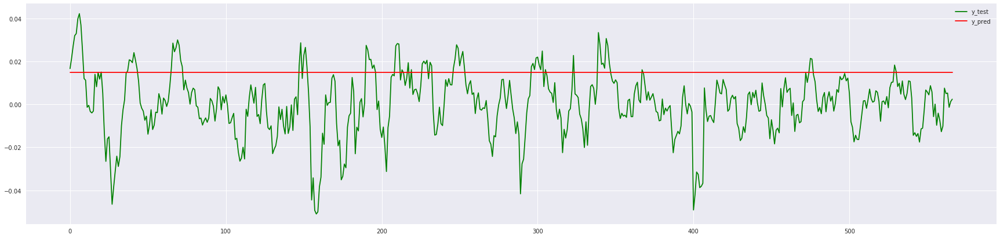

trend:  1   29
Best C:  13.89495494373136  best gamma:  0.0001


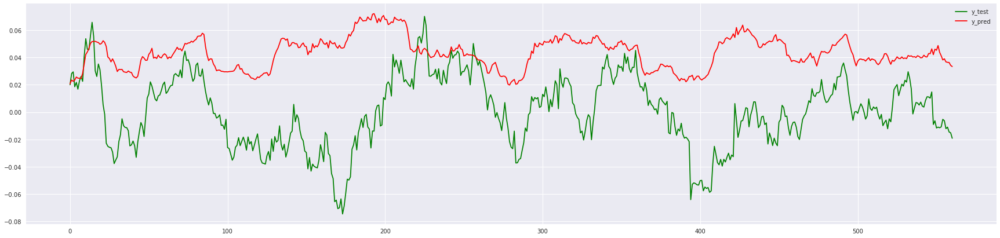

trend:  1   36
Best C:  0.07196856730011514  best gamma:  0.019306977288832496


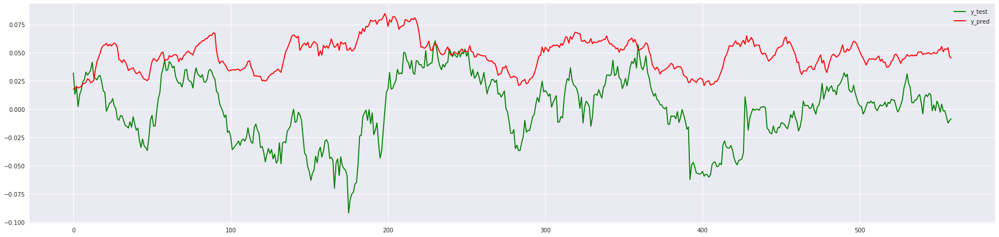

trend:  1   50
Best C:  0.019306977288832496  best gamma:  0.07196856730011514


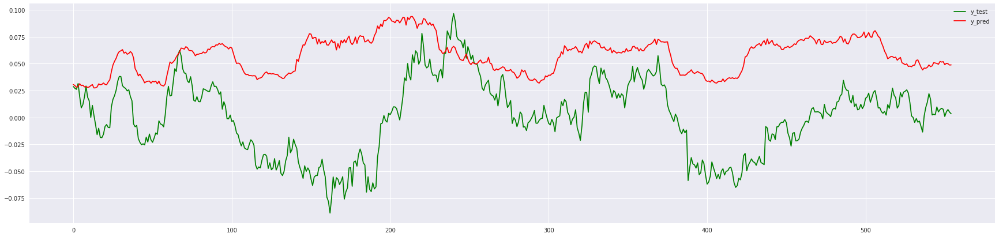

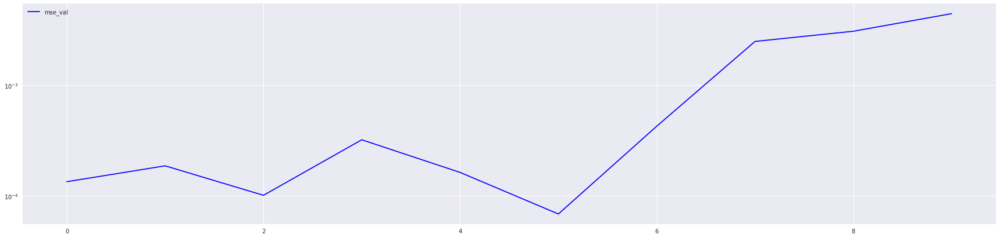

[0.00013437139905971885, 0.00018690829746390605, 0.00010121720344502365, 0.0003216484823818562, 0.00016296308228257276, 6.860360284403967e-05, 0.0004263526637669902, 0.002492170678112759, 0.0030823085397118925, 0.004445802843151114]



==================== CMCSA ==================== 



trend:  -48   0
Best C:  10000.0  best gamma:  0.0003727593720314938


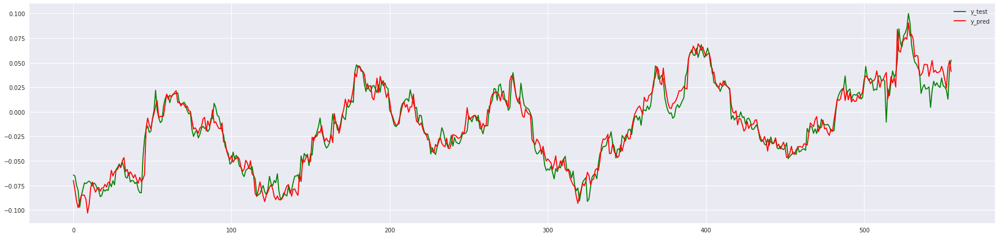

trend:  -35   0
Best C:  10000.0  best gamma:  0.0003727593720314938


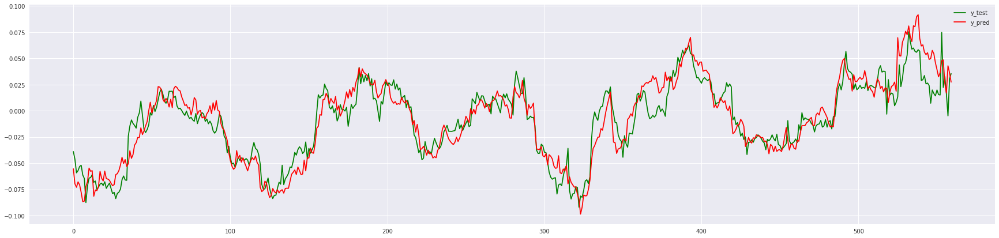

trend:  -28   0
Best C:  10000.0  best gamma:  0.0001


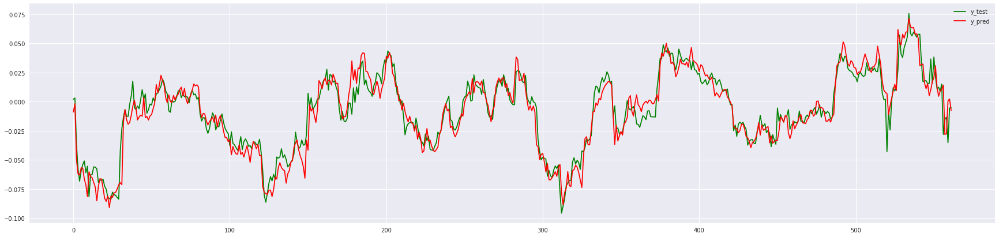

trend:  -7   0
Best C:  2682.695795279722  best gamma:  0.0003727593720314938


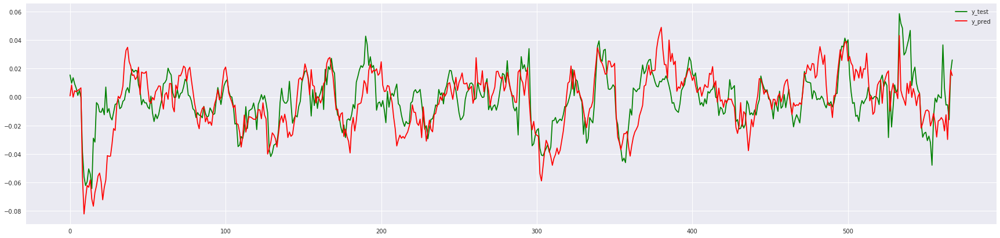

trend:  -1   0
Best C:  3.727593720314938  best gamma:  0.2682695795279725


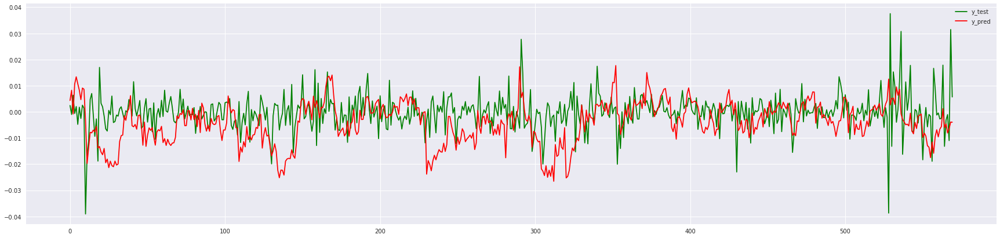

trend:  1   2
Best C:  2682.695795279722  best gamma:  3.727593720314938


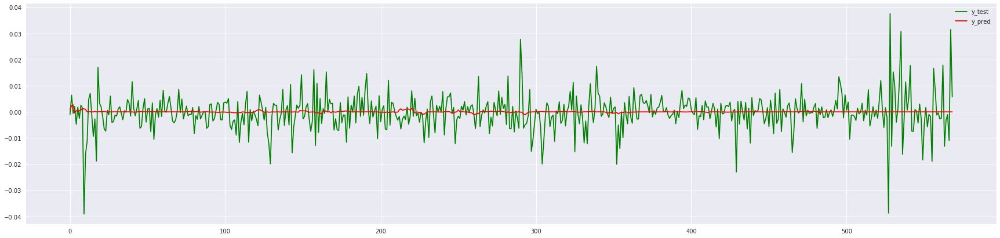

trend:  1   8
Best C:  2682.695795279722  best gamma:  13.89495494373136


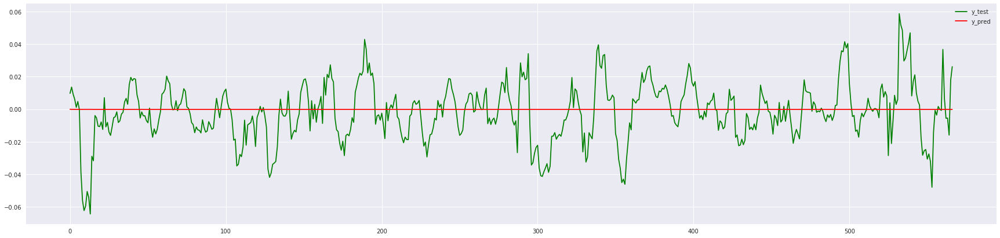

trend:  1   29
Best C:  719.6856730011514  best gamma:  0.07196856730011514


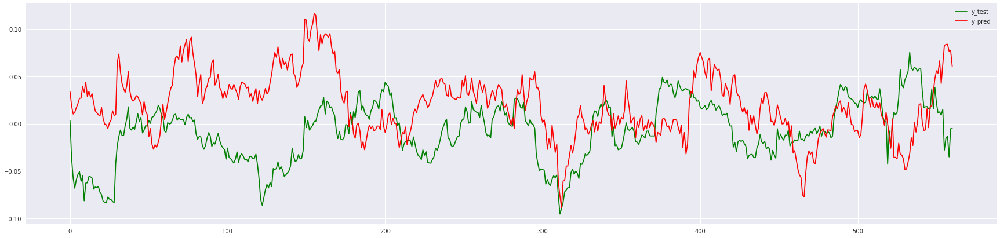

trend:  1   36
Best C:  10000.0  best gamma:  0.07196856730011514


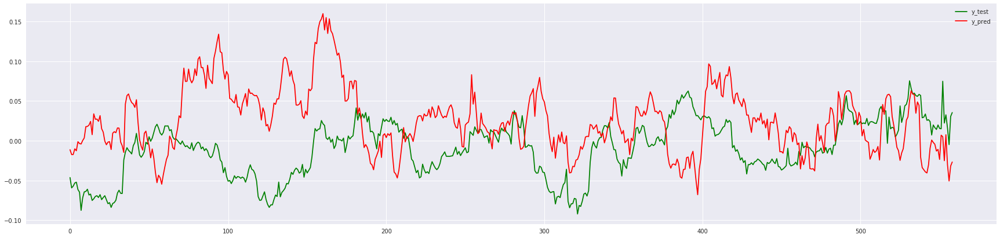

trend:  1   50
Best C:  10000.0  best gamma:  0.07196856730011514


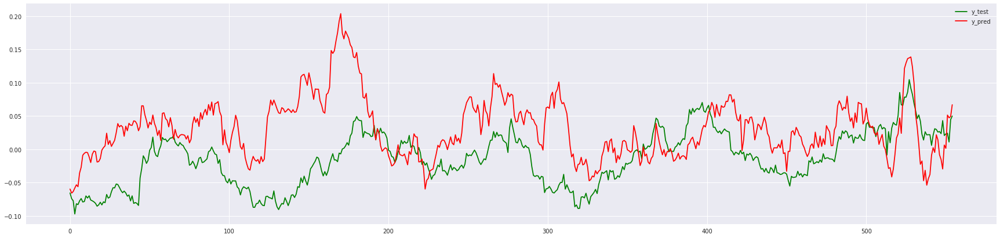

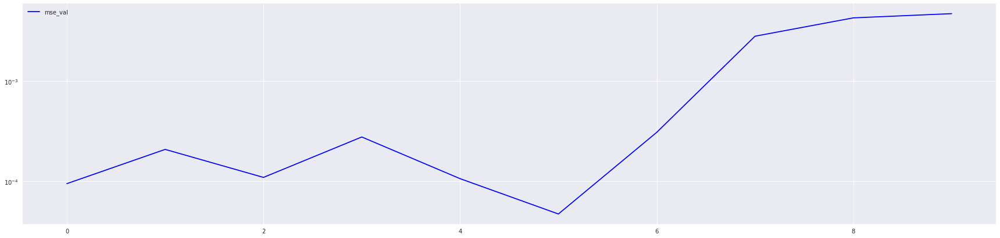

[9.508924560651975e-05, 0.00020834141532008804, 0.0001097099019046959, 0.00027685030568028315, 0.00010658511303551818, 4.74761997448964e-05, 0.0003077690665843017, 0.002782814630190175, 0.004235200702384681, 0.004664449584514904]



==================== NVDA ==================== 



trend:  -48   0
Best C:  719.6856730011514  best gamma:  0.0003727593720314938


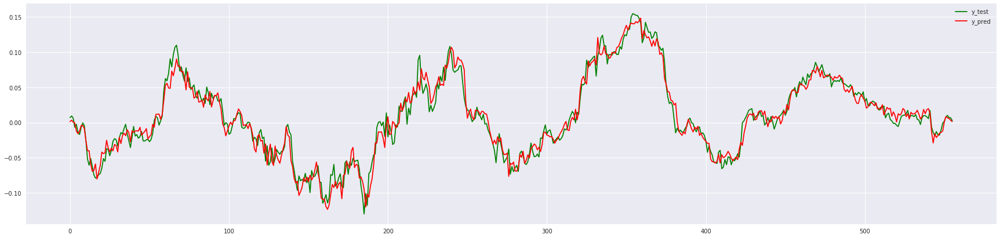

trend:  -35   0
Best C:  10000.0  best gamma:  0.0013894954943731374


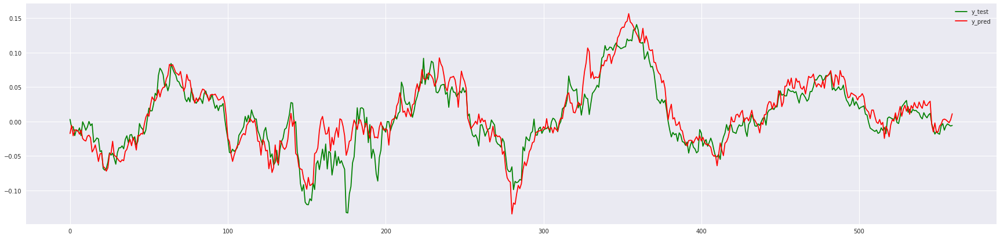

trend:  -28   0
Best C:  2682.695795279722  best gamma:  0.0001


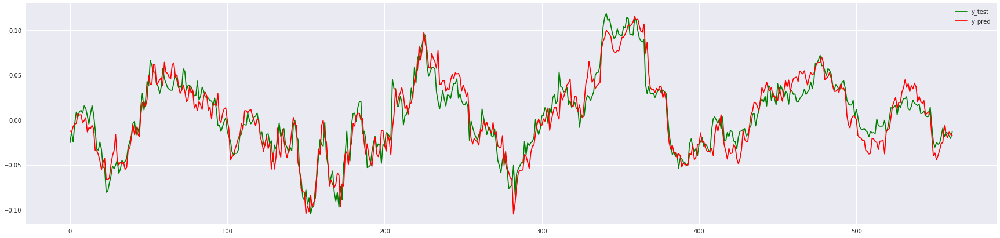

trend:  -7   0
Best C:  719.6856730011514  best gamma:  0.0003727593720314938


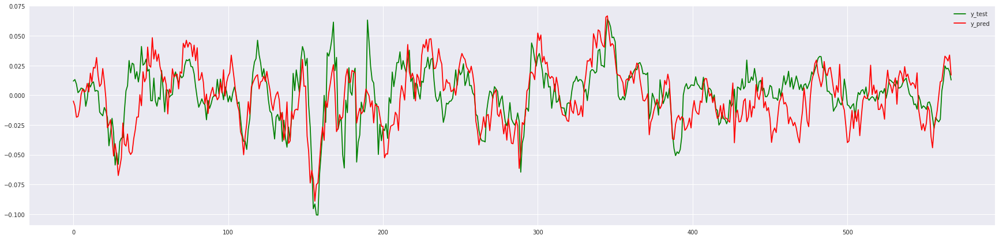

trend:  -1   0
Best C:  13.89495494373136  best gamma:  1.0


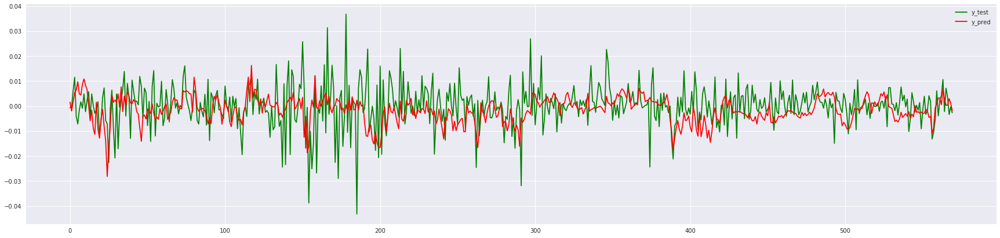

trend:  1   2
Best C:  3.727593720314938  best gamma:  0.0001


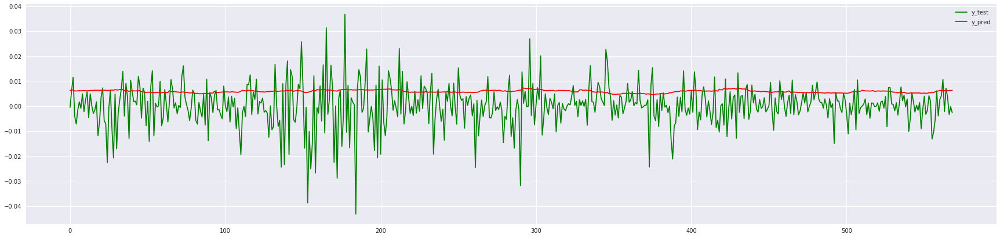

trend:  1   8
Best C:  0.019306977288832496  best gamma:  0.2682695795279725


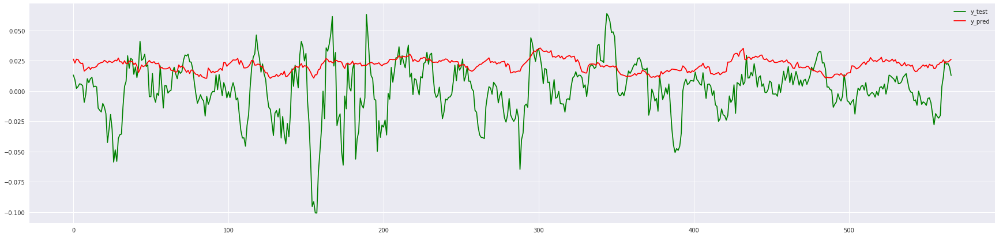

trend:  1   29
Best C:  10000.0  best gamma:  10000.0


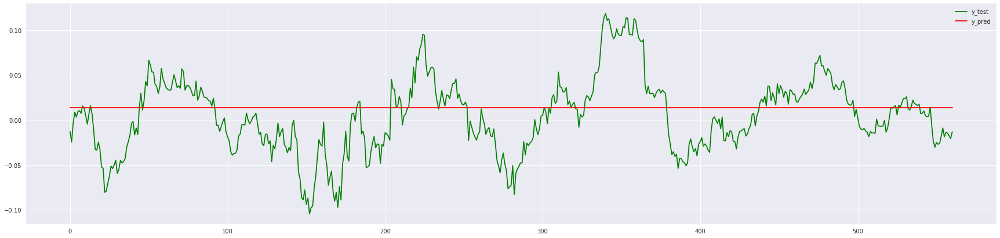

trend:  1   36
Best C:  10000.0  best gamma:  10000.0


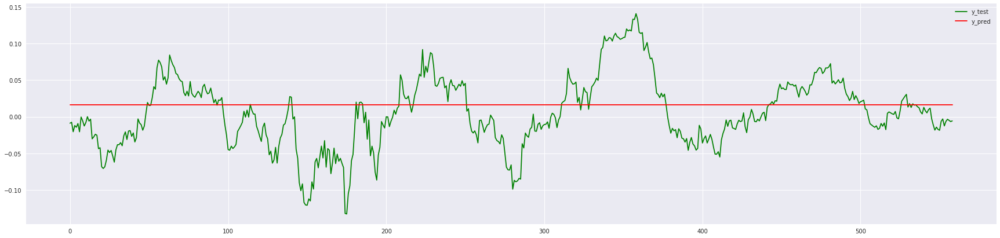

trend:  1   50
Best C:  2682.695795279722  best gamma:  13.89495494373136


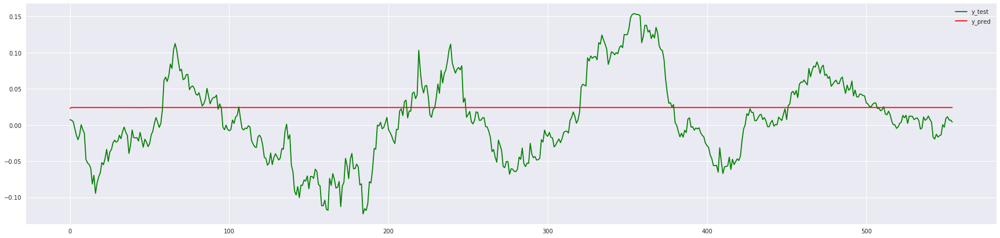

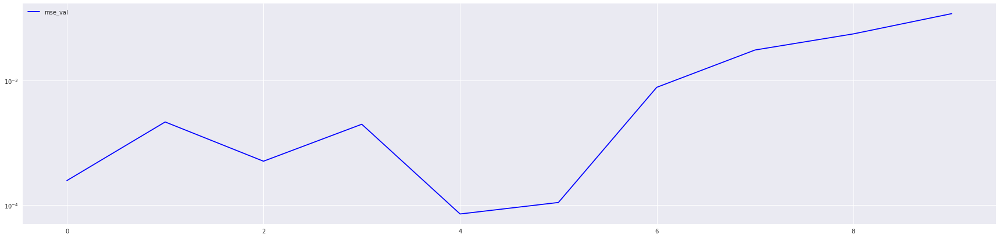

[0.00015769271709098015, 0.0004653665327810165, 0.00022553623018329766, 0.0004461454694932803, 8.518516083702952e-05, 0.0001053159210576796, 0.0008817316564048423, 0.0017558936478971226, 0.0023637967407905574, 0.0034343481116607326]



==================== NFLX ==================== 



trend:  -48   0
Best C:  2682.695795279722  best gamma:  0.0003727593720314938


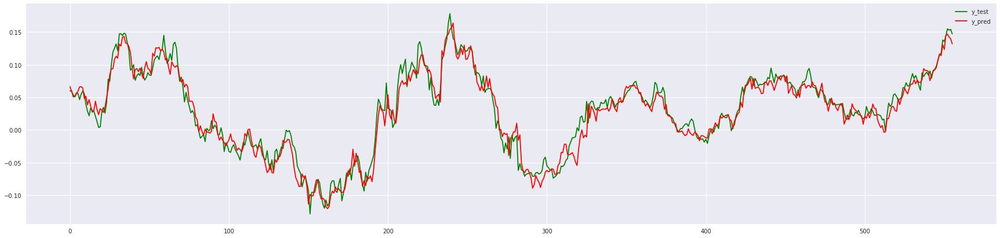

trend:  -35   0
Best C:  10000.0  best gamma:  0.0013894954943731374


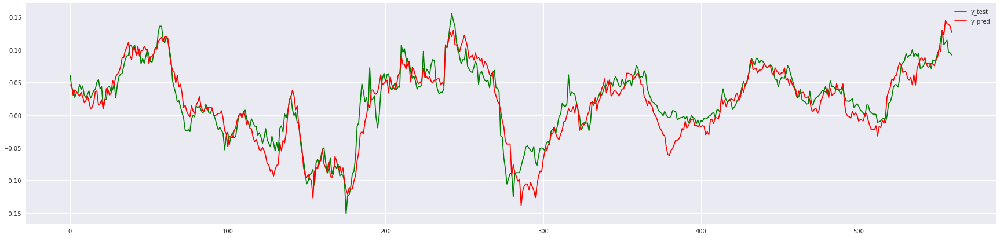

trend:  -28   0
Best C:  2682.695795279722  best gamma:  0.0003727593720314938


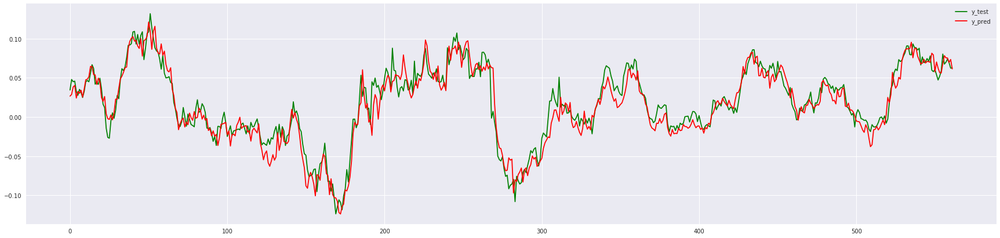

trend:  -7   0
Best C:  2682.695795279722  best gamma:  0.0013894954943731374


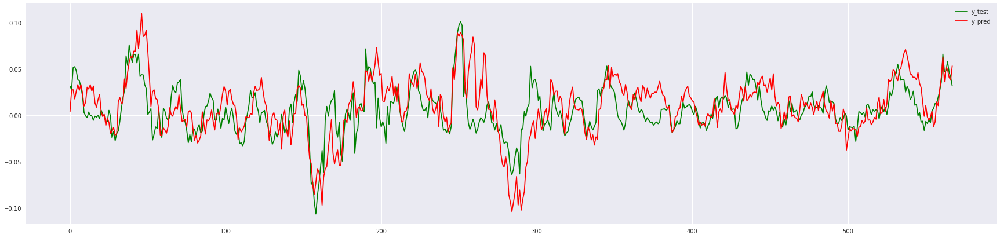

trend:  -1   0
Best C:  193.06977288832496  best gamma:  0.0013894954943731374


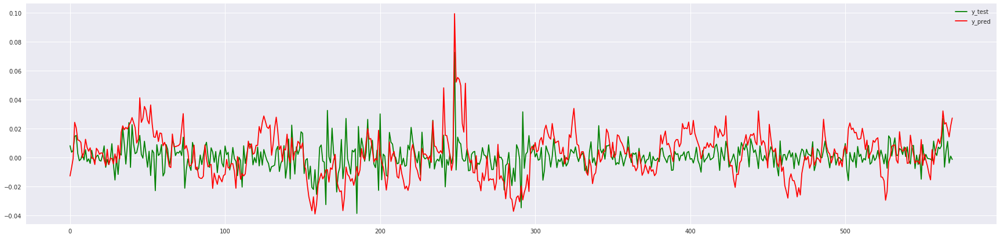

trend:  1   2
Best C:  51.79474679231202  best gamma:  1.0


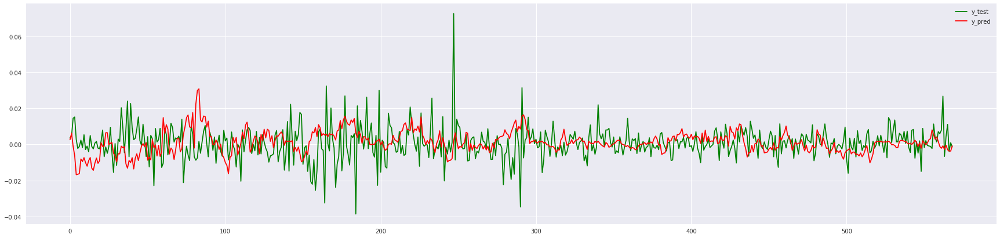

trend:  1   8
Best C:  0.2682695795279725  best gamma:  13.89495494373136


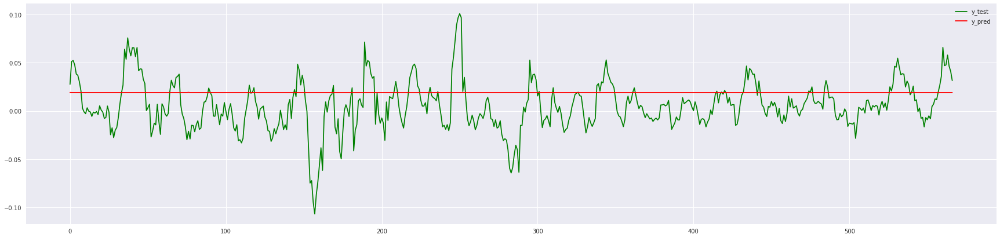

trend:  1   29
Best C:  0.2682695795279725  best gamma:  13.89495494373136


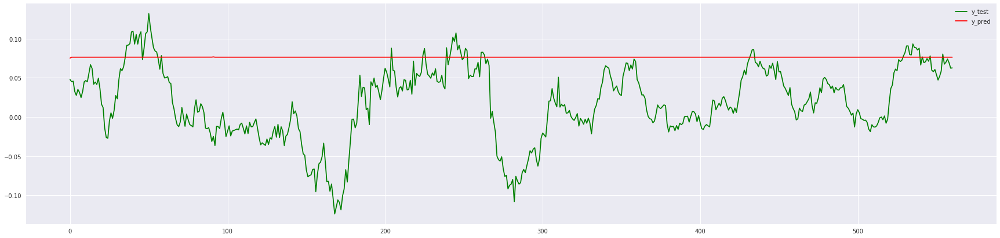

trend:  1   36
Best C:  0.2682695795279725  best gamma:  13.89495494373136


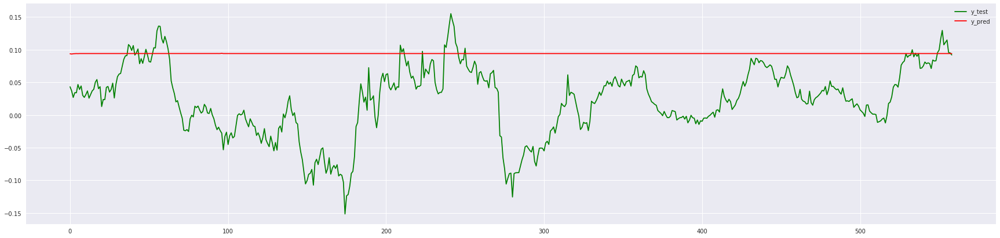

trend:  1   50
Best C:  0.2682695795279725  best gamma:  13.89495494373136


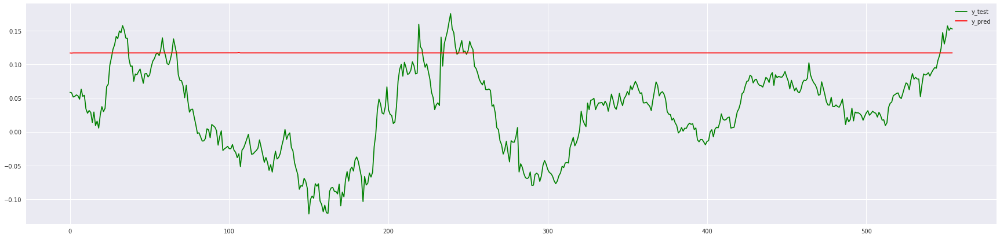

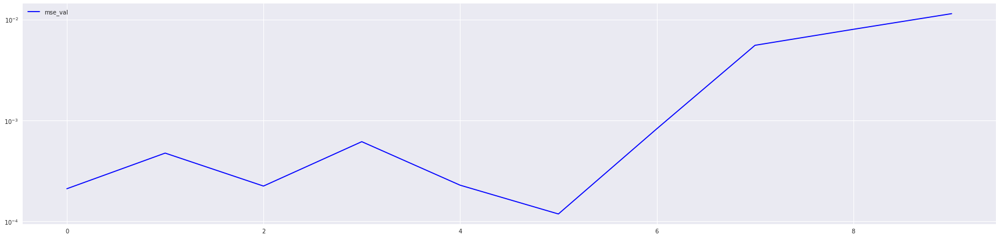

[0.0002098743534258356, 0.0004733062389295739, 0.00022307714978956461, 0.0006142899066321699, 0.00022759430346542829, 0.0001179806364056584, 0.0008233056901584361, 0.0055407609262282794, 0.007978833348832742, 0.011405374642066469]


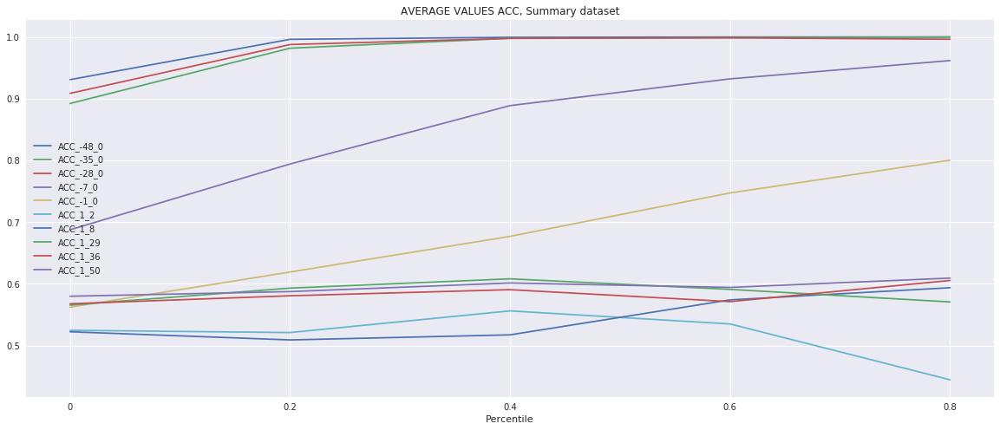

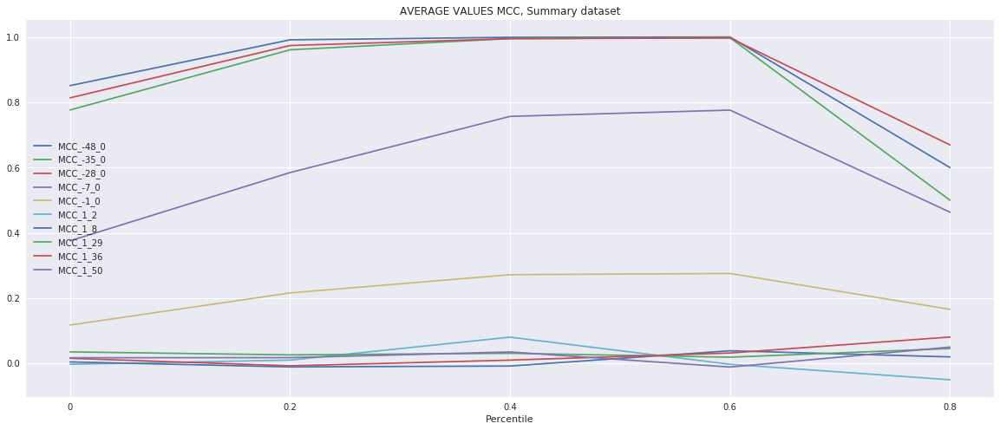

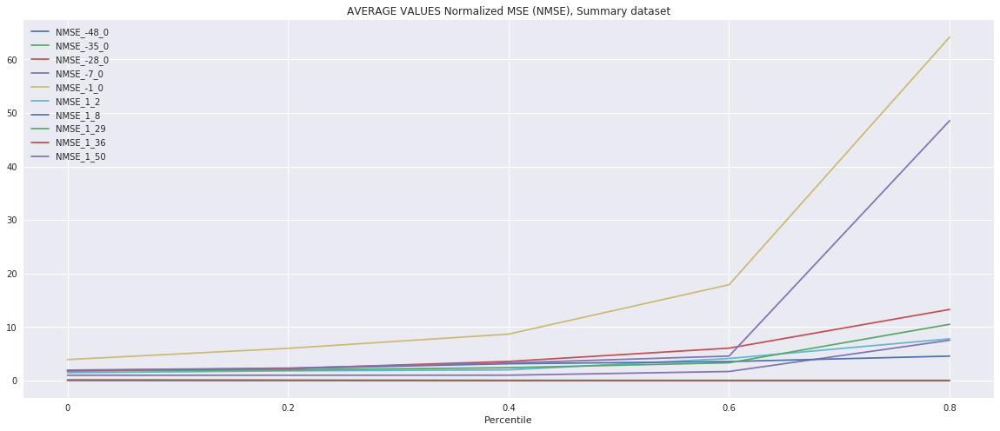

MSEs_avg:  [[1.22599111e-04 1.37204779e-04 1.46415619e-04 1.62148024e-04
  1.48238121e-04]
 [2.40538012e-04 2.58217797e-04 3.02865283e-04 3.54348748e-04
  4.52693564e-04]
 [1.35395428e-04 1.59262983e-04 1.87597887e-04 2.53572619e-04
  2.95104317e-04]
 [3.50374822e-04 5.43440774e-04 8.94867892e-04 1.48820263e-03
  1.99050191e-03]
 [2.04854118e-04 3.68681571e-04 7.36671990e-04 9.83608620e-04
  1.28972673e-03]
 [7.85870413e-05 1.12103205e-04 1.69161217e-04 2.89425936e-04
  4.28453107e-04]
 [6.58711523e-04 8.59720501e-04 1.26839582e-03 1.52485816e-03
  1.83253924e-03]
 [2.17125846e-03 2.27829274e-03 2.56805202e-03 3.21216155e-03
  3.93385779e-03]
 [2.93026003e-03 3.19009148e-03 3.87273802e-03 5.10417355e-03
  5.86398758e-03]
 [4.08213794e-03 4.41210551e-03 5.52026904e-03 6.80328343e-03
  9.58585082e-03]]
MSEs_avg_weight:  [[0.0001481  0.00014536 0.00014335 0.00014502 0.00013024]
 [0.0003207  0.00028168 0.00026164 0.00026061 0.0003541 ]
 [0.0001678  0.00015575 0.00015603 0.00016713 0.000157

In [7]:
MSEs_avg_weight = np.zeros([len(TREND_WINDOWs), 5])
MSEs_avg = np.zeros([len(TREND_WINDOWs), 5])
NMSEs_avg = np.zeros([len(TREND_WINDOWs), 5])
ACCs_avg = np.zeros([len(TREND_WINDOWs), 5])
MCCs_avg = np.zeros([len(TREND_WINDOWs), 5])

with open('model_selection_info.pickle', 'rb') as handle:
    model_selection_results = pickle.load(handle)

for ticker in tickers:
    print('\n\n\n==================== '+str(ticker)+' ==================== \n\n\n')
    MSEs = []
    ds = DatasetManager()
    ds.load_dataset(ticker = ticker, kind = kind_of_dataset,technicalFeatures=True)

    for (init, finish) in TREND_WINDOWs:
        print('trend: ',init,' ',finish)
        (x_tv,y_tv),(x_test,y_test),_ = ds.get_dataset_for_trend(init, finish)
        if (ticker, init, finish) not in model_selection_results:
            (best_c,best_g) = cv(x_tv,y_tv)
        else:
            (best_c,best_g) = model_selection_results[(ticker, init, finish)]
            
        model_selection_results[(ticker, init, finish)] = (best_c,best_g)
        print('Best C: ',best_c,' best gamma: ',best_g)
        svm_model = svm.SVR(kernel='rbf', C=best_c, gamma=best_g, tol=1e-5, epsilon=1e-3)
        weights = np.power(y_tv,2)
        m = min(weights)
        M = max(weights)
        weights = (weights-m)/(M-m)
        svm_model.fit(x_tv,y_tv, sample_weight = weights)
        y_pred = svm_model.predict(x_test)
        np.savetxt('test_predictions/'+ticker+'_'+str(init)+'_'+str(finish)+'.csv', y_pred, delimiter=",")
        
        mse = MSE(y_test,y_pred)
        MSEs.append(mse)
        plt.figure(figsize=(30,7))
        plt.plot(y_test,'g', label='y_test')
        plt.plot(y_pred,'r', label='y_pred')
        plt.legend()
        plt.show() 
    plt.figure(figsize=(30,7))
    plt.semilogy(MSEs,'b',label='mse_val')
    plt.legend()
    plt.show() 
    print(MSEs)



with open('model_selection_info.pickle', 'wb') as handle:
    pickle.dump(model_selection_results, handle, protocol=pickle.HIGHEST_PROTOCOL)

AAPL   1   2


/home/simone/anaconda3/lib/python3.6/site-packages/sklearn/metrics/classification.py:538: RuntimeWarning: invalid value encountered in double_scalars
  mcc = cov_ytyp / np.sqrt(cov_ytyt * cov_ypyp)


AAPL   1   8
AAPL   1   29
AAPL   1   36
AAPL   1   50
AMZN   1   2
AMZN   1   8
AMZN   1   29
AMZN   1   36
AMZN   1   50
GOOGL   1   2
GOOGL   1   8
GOOGL   1   29
GOOGL   1   36
GOOGL   1   50
MSFT   1   2
MSFT   1   8
MSFT   1   29
MSFT   1   36
MSFT   1   50
FB   1   2
FB   1   8
FB   1   29
FB   1   36
FB   1   50
INTC   1   2
INTC   1   8
INTC   1   29
INTC   1   36
INTC   1   50
CSCO   1   2
CSCO   1   8
CSCO   1   29
CSCO   1   36
CSCO   1   50
CMCSA   1   2
CMCSA   1   8
CMCSA   1   29
CMCSA   1   36
CMCSA   1   50
NVDA   1   2
NVDA   1   8
NVDA   1   29
NVDA   1   36
NVDA   1   50
NFLX   1   2
NFLX   1   8
NFLX   1   29
NFLX   1   36
NFLX   1   50


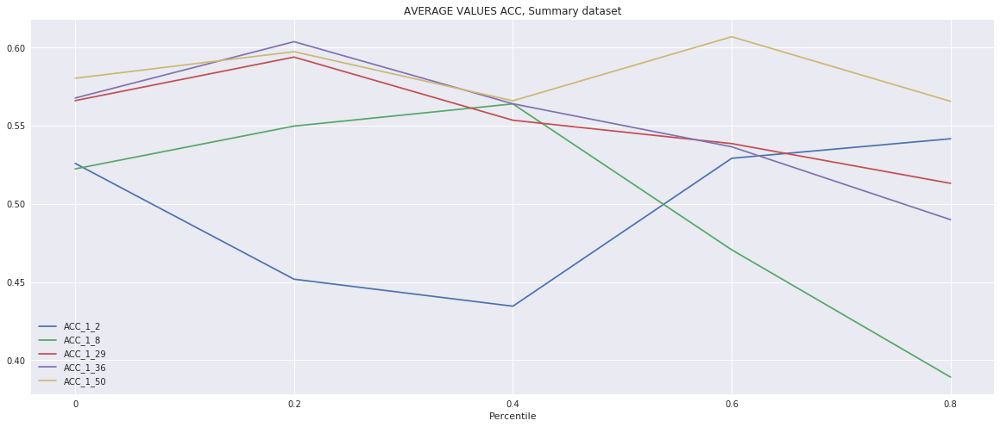

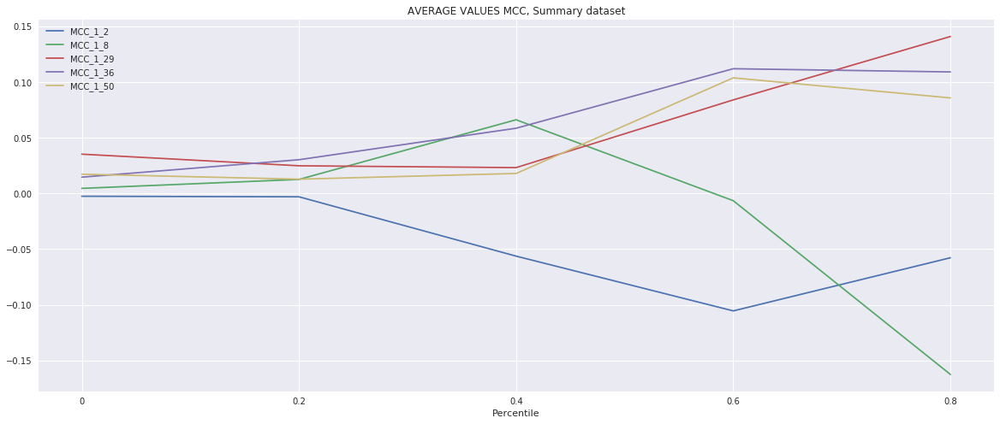

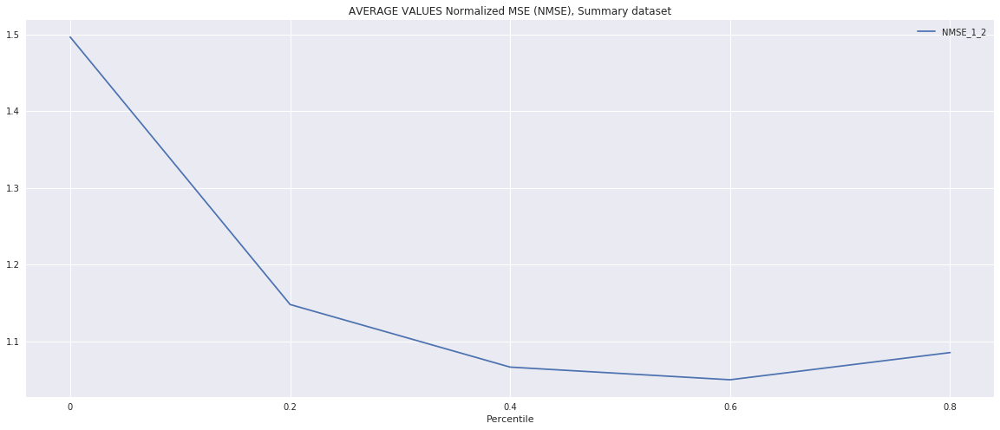

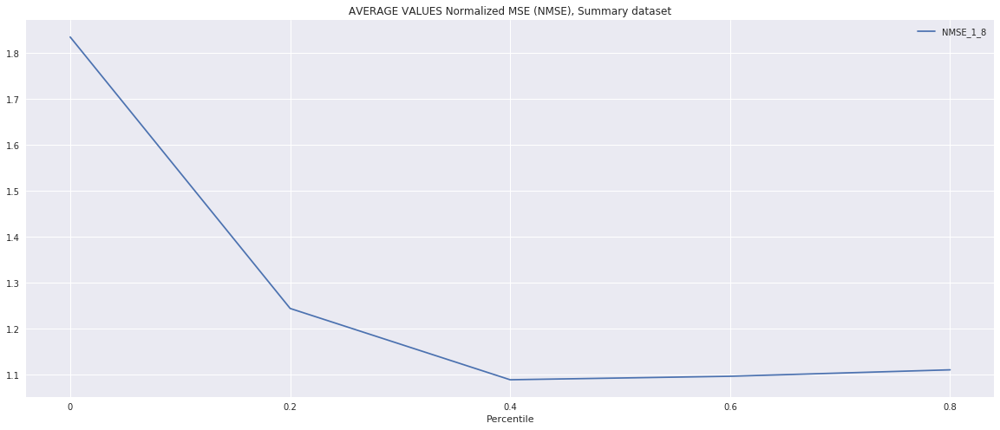

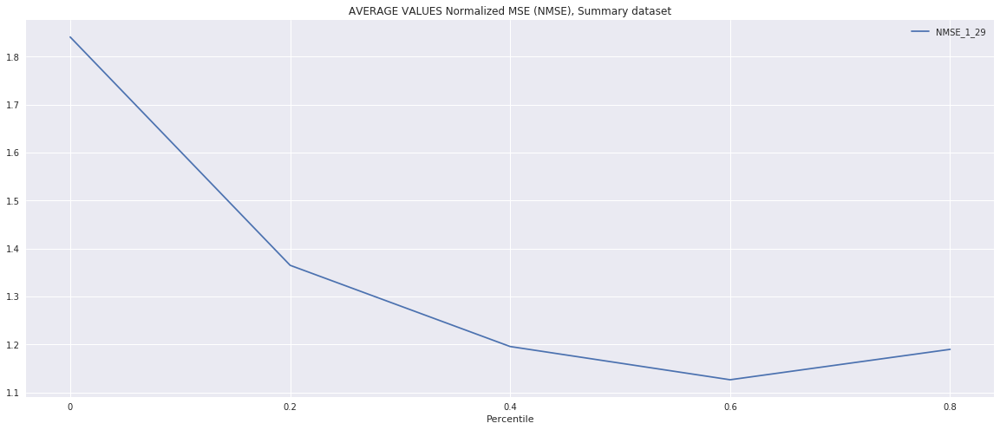

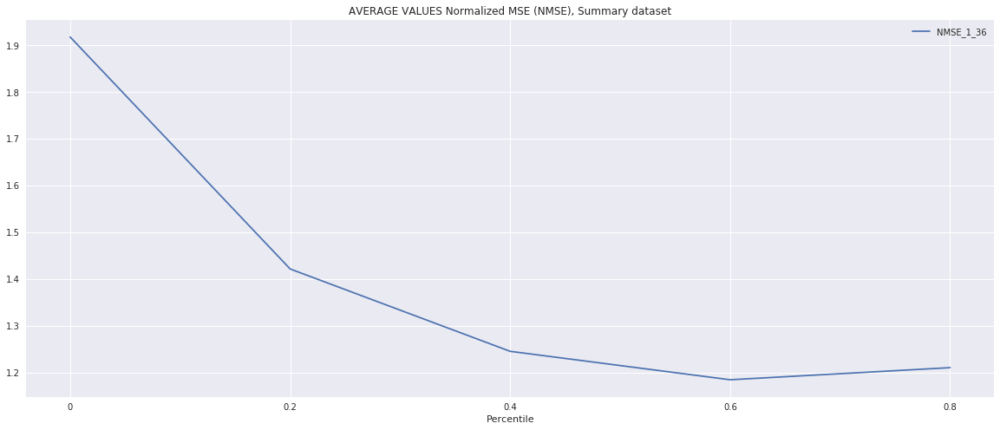

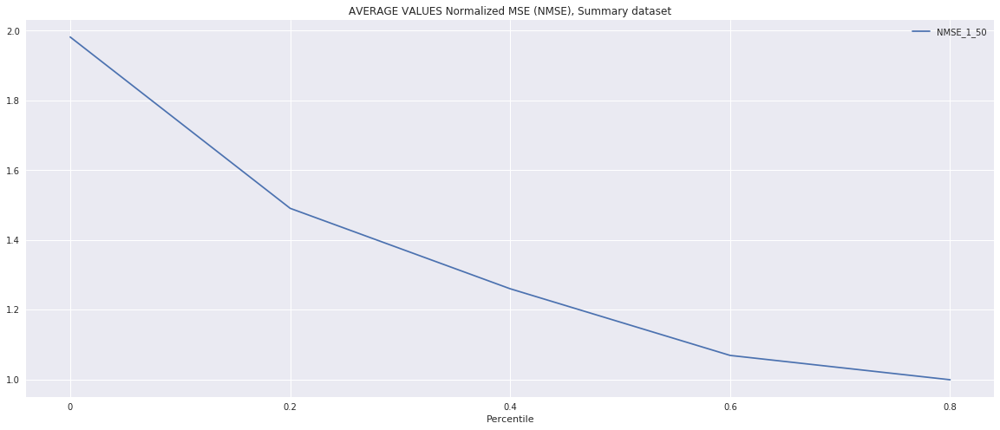

In [8]:
#Predictions Percentile on fluctuations
from sklearn.metrics import matthews_corrcoef, accuracy_score
from sklearn.metrics import mean_squared_error as MSE

def sign(vec):
    return [1 if v>0 else 0 for v in vec]

FUTURE_WINDOWs = [(1,2),(1,8),(1,29),(1,36),(1,50)]
NMSEs_avg = np.zeros([len(FUTURE_WINDOWs), 5])
ACCs_avg = np.zeros([len(FUTURE_WINDOWs), 5])
MSEs_avg = np.zeros([len(FUTURE_WINDOWs), 5])
MCCs_avg = np.zeros([len(FUTURE_WINDOWs), 5])
MSEs_avg_weight = np.zeros([len(FUTURE_WINDOWs), 5])

for ticker in tickers:
    for (init, finish) in FUTURE_WINDOWs:
        print(ticker,' ',init,' ',finish)
        ds = DatasetManager()
        ds.load_dataset(ticker = ticker, kind = kind_of_dataset, technicalFeatures=True)
        (x_tv,y_tv),(x_test,y_test),dates_test = ds.get_dataset_for_trend(init, finish, perc_train = 0.7)
        y_pred = np.loadtxt('test_predictions/'+ticker+'_'+str(init)+'_'+str(finish)+'.csv', delimiter=",")
        
        thresholds = np.linspace(0, max(np.absolute(y_test)), num=6)[:-1]
        for t in range(0,5):
            threshold = thresholds[t]
            y_over_th = []
            y_pred_over_th = []
            for y, y_p in zip(y_test, y_pred):
                if(abs(y)> threshold):
                    y_over_th.append(y)
                    y_pred_over_th.append(y_p)
            mse = MSE(y_over_th,y_pred_over_th)
            nmse =  MSE(y_over_th,y_pred_over_th) / MSE(y_over_th,[0]*len(y_over_th))
            mcc = matthews_corrcoef(sign(y_over_th), sign(y_pred_over_th))
            acc = accuracy_score(sign(y_over_th), sign(y_pred_over_th))
            MSEs_avg[FUTURE_WINDOWs.index((init, finish)), t]+= mse/len(tickers)
            NMSEs_avg[FUTURE_WINDOWs.index((init, finish)), t]+= nmse/len(tickers)
            MSEs_avg_weight[FUTURE_WINDOWs.index((init, finish)), t]+= mse_w/len(tickers)
            ACCs_avg[FUTURE_WINDOWs.index((init, finish)), t]+= acc/len(tickers)
            MCCs_avg[FUTURE_WINDOWs.index((init, finish)), t]+= mcc/len(tickers)

    labels = [0,0.2,.4,.6,.8]
plt.figure(figsize=(20,8))
for i in range(len(FUTURE_WINDOWs)):
    plt.plot(ACCs_avg[i,:], label='ACC_'+str(FUTURE_WINDOWs[i][0])+'_'+str(FUTURE_WINDOWs[i][1]))
plt.xlabel('Percentile')
plt.xticks(range(0,len(labels)), labels)
plt.title('AVERAGE VALUES ACC, '+str(kind_of_dataset)+' dataset')
plt.legend()
plt.show() 
plt.figure(figsize=(20,8))
for i in range(len(FUTURE_WINDOWs)):
    plt.plot(MCCs_avg[i,:], label='MCC_'+str(FUTURE_WINDOWs[i][0])+'_'+str(FUTURE_WINDOWs[i][1]))
plt.xlabel('Percentile')
plt.xticks(range(0,len(labels)), labels)
plt.title('AVERAGE VALUES MCC, '+str(kind_of_dataset)+' dataset')
plt.legend()
plt.show() 
for i in range(len(FUTURE_WINDOWs)):
    plt.figure(figsize=(20,8)) 
    plt.plot(NMSEs_avg[i,:], label='NMSE_'+str(FUTURE_WINDOWs[i][0])+'_'+str(FUTURE_WINDOWs[i][1]))
    plt.xlabel('Percentile')
    plt.xticks(range(0,len(labels)), labels)
    plt.title('AVERAGE VALUES Normalized MSE (NMSE), '+str(kind_of_dataset)+' dataset')
    plt.legend()
    plt.show() 

np.savetxt('NMSE_percentile_on_fluctuations.csv', NMSEs_avg, delimiter=",")
np.savetxt('ACC_percentile_on_fluctuations.csv', ACCs_avg, delimiter=",")
np.savetxt('MCC_percentile_on_fluctuations.csv', MCCs_avg, delimiter=",")

AAPL   1   2


/home/simone/anaconda3/lib/python3.6/site-packages/sklearn/metrics/classification.py:538: RuntimeWarning: invalid value encountered in double_scalars
  mcc = cov_ytyp / np.sqrt(cov_ytyt * cov_ypyp)


AAPL   1   8
AAPL   1   29
AAPL   1   36
AAPL   1   50
AMZN   1   2
AMZN   1   8
AMZN   1   29
AMZN   1   36
AMZN   1   50
GOOGL   1   2
GOOGL   1   8
GOOGL   1   29
GOOGL   1   36
GOOGL   1   50
MSFT   1   2
MSFT   1   8
MSFT   1   29
MSFT   1   36
MSFT   1   50
FB   1   2
FB   1   8
FB   1   29
FB   1   36
FB   1   50
INTC   1   2
INTC   1   8
INTC   1   29
INTC   1   36
INTC   1   50
CSCO   1   2
CSCO   1   8
CSCO   1   29
CSCO   1   36
CSCO   1   50
CMCSA   1   2
CMCSA   1   8
CMCSA   1   29
CMCSA   1   36
CMCSA   1   50
NVDA   1   2
NVDA   1   8
NVDA   1   29
NVDA   1   36
NVDA   1   50
NFLX   1   2
NFLX   1   8
NFLX   1   29
NFLX   1   36
NFLX   1   50


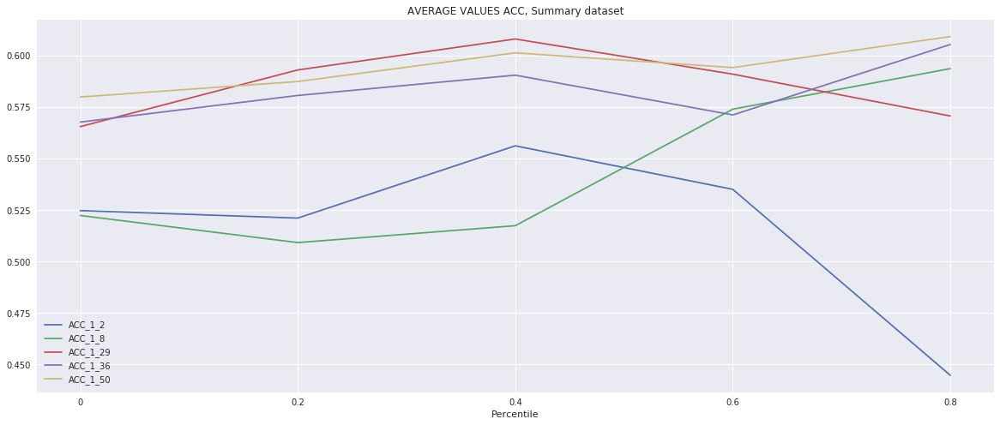

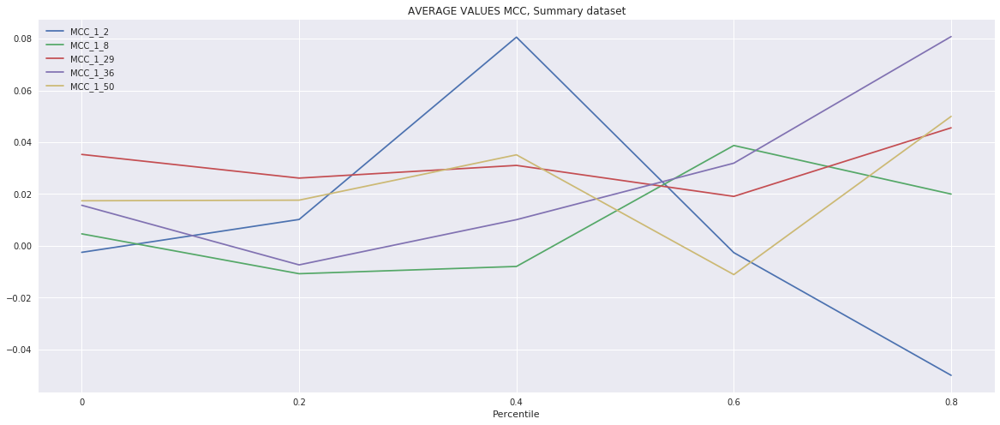

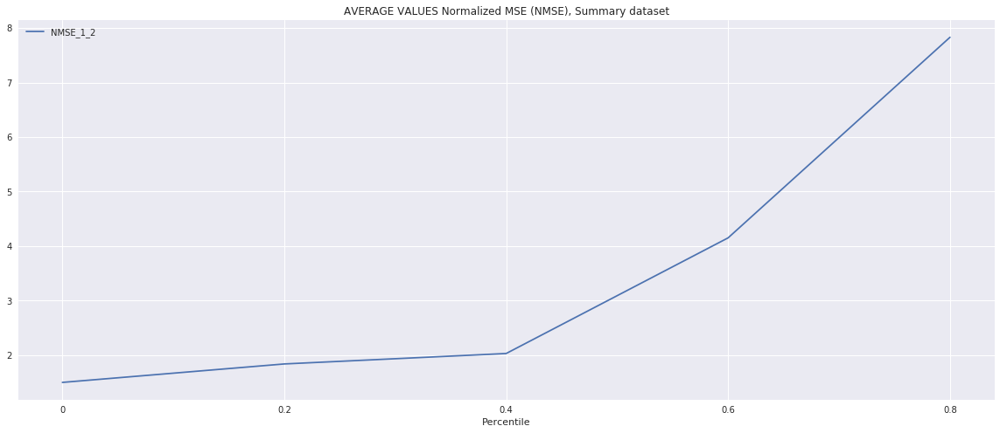

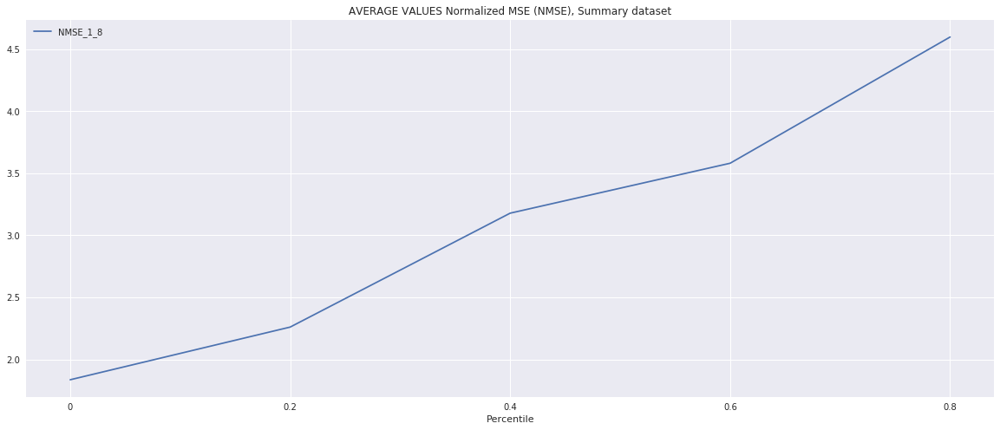

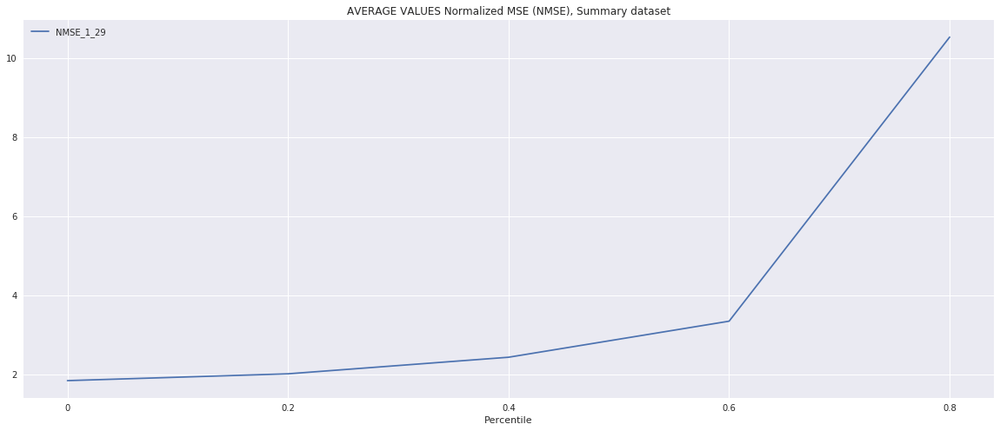

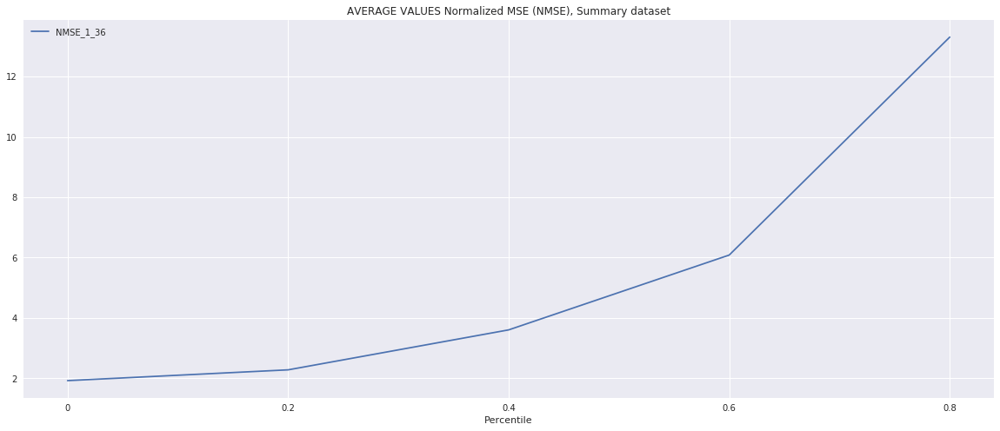

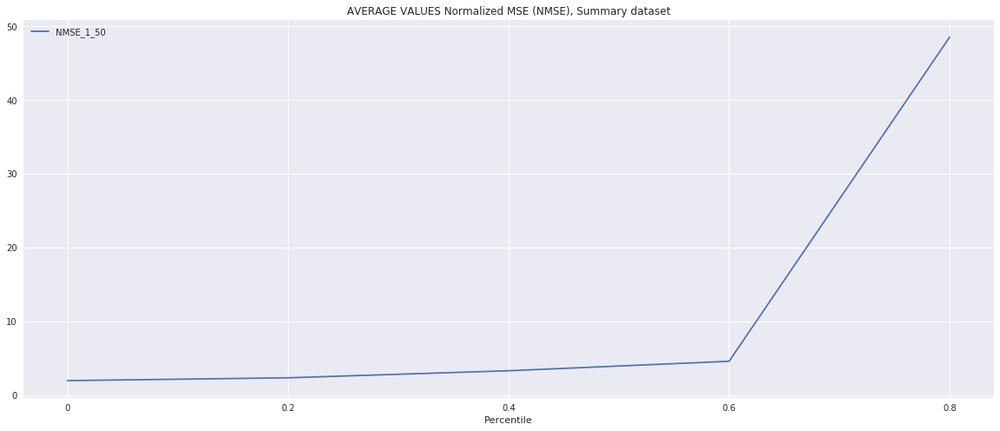

In [9]:
#Predictions percentile on predictions
from sklearn.metrics import matthews_corrcoef, accuracy_score
from sklearn.metrics import mean_squared_error as MSE

def sign(vec):
    return [1 if v>0 else 0 for v in vec]

FUTURE_WINDOWs = [(1,2),(1,8),(1,29),(1,36),(1,50)]
NMSEs_avg = np.zeros([len(FUTURE_WINDOWs), 5])
ACCs_avg = np.zeros([len(FUTURE_WINDOWs), 5])
MSEs_avg = np.zeros([len(FUTURE_WINDOWs), 5])
MCCs_avg = np.zeros([len(FUTURE_WINDOWs), 5])
MSEs_avg_weight = np.zeros([len(FUTURE_WINDOWs), 5])

for ticker in tickers:
    for (init, finish) in FUTURE_WINDOWs:
        print(ticker,' ',init,' ',finish)
        ds = DatasetManager()
        ds.load_dataset(ticker = ticker, kind = kind_of_dataset, technicalFeatures=True)
        (x_tv,y_tv),(x_test,y_test),dates_test = ds.get_dataset_for_trend(init, finish, perc_train = 0.7)
        y_pred = np.loadtxt('test_predictions/'+ticker+'_'+str(init)+'_'+str(finish)+'.csv', delimiter=",")
        
        thresholds = np.linspace(0, max(np.absolute(y_pred)), num=6)[:-1]
        for t in range(0,5):
            threshold = thresholds[t]
            y_over_th = []
            y_pred_over_th = []
            for y, y_p in zip(y_test, y_pred):
                if(abs(y_p)> threshold):
                    y_over_th.append(y)
                    y_pred_over_th.append(y_p)
            nmse =  MSE(y_over_th,y_pred_over_th) / MSE(y_over_th,[0]*len(y_over_th))
            mcc = matthews_corrcoef(sign(y_over_th), sign(y_pred_over_th))
            acc = accuracy_score(sign(y_over_th), sign(y_pred_over_th))
            NMSEs_avg[FUTURE_WINDOWs.index((init, finish)), t]+= nmse/len(tickers)
            ACCs_avg[FUTURE_WINDOWs.index((init, finish)), t]+= acc/len(tickers)
            MCCs_avg[FUTURE_WINDOWs.index((init, finish)), t]+= mcc/len(tickers)

    labels = [0,0.2,.4,.6,.8]
plt.figure(figsize=(20,8))
for i in range(len(FUTURE_WINDOWs)):
    plt.plot(ACCs_avg[i,:], label='ACC_'+str(FUTURE_WINDOWs[i][0])+'_'+str(FUTURE_WINDOWs[i][1]))
plt.xlabel('Percentile')
plt.xticks(range(0,len(labels)), labels)
plt.title('AVERAGE VALUES ACC, '+str(kind_of_dataset)+' dataset')
plt.legend()
plt.show() 
plt.figure(figsize=(20,8))
for i in range(len(FUTURE_WINDOWs)):
    plt.plot(MCCs_avg[i,:], label='MCC_'+str(FUTURE_WINDOWs[i][0])+'_'+str(FUTURE_WINDOWs[i][1]))
plt.xlabel('Percentile')
plt.xticks(range(0,len(labels)), labels)
plt.title('AVERAGE VALUES MCC, '+str(kind_of_dataset)+' dataset')
plt.legend()
plt.show() 
for i in range(len(FUTURE_WINDOWs)):
    plt.figure(figsize=(20,8))
    plt.plot(NMSEs_avg[i,:], label='NMSE_'+str(FUTURE_WINDOWs[i][0])+'_'+str(FUTURE_WINDOWs[i][1]))
    plt.xlabel('Percentile')
    plt.xticks(range(0,len(labels)), labels)
    plt.title('AVERAGE VALUES Normalized MSE (NMSE), '+str(kind_of_dataset)+' dataset')
    plt.legend()
    plt.show() 
    

np.savetxt('NMSE_percentile_on_predictions.csv', NMSEs_avg, delimiter=",")
np.savetxt('ACC_percentile_on_predictions.csv', ACCs_avg, delimiter=",")
np.savetxt('MCC_percentile_on_predictions.csv', MCCs_avg, delimiter=",")